<h1>COSIpy with continuum response</h1>

In [1]:
from COSIpy import *
import response
from fit import fit
plt.style.use('thomas')

Welcome to JupyROOT 6.22/02


/usr/local/Cellar/python/3.7.7/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [2]:
plt.style.use('thomas')

<h3>Data set (simulation): flat spectrum between 100 and 5000 keV at ~zenith without background:<br><br>
$S(E) = Crab$</h3>

In [3]:
data_dir = '/Users/thomassiegert/data/COSI/Simulations/Crab/'
filename1 = 'Crab_F10C_Z00_wBG.inc1.id1_CE0000-5000keV.tra.gz'
filename2 = 'Crab_F10C_Z18_wBG.inc1.id1_CE0000-5000keV.tra.gz'
filename3 = 'Crab_F10C_Z36_wBG.inc1.id1_CE0000-5000keV.tra.gz'
filename4 = 'Crab_F10C_Z54_wBG.inc1.id1_CE0000-5000keV.tra.gz'

<h3>COSIpy work flow:</h3>

In [4]:
# create analysis object
analysis1 = COSIpy(data_dir,filename1)
analysis2 = COSIpy(data_dir,filename2)
analysis3 = COSIpy(data_dir,filename3)
analysis4 = COSIpy(data_dir,filename4)

In [5]:
# read in data (tra file)
analysis1.read_COSI_DataSet()
analysis2.read_COSI_DataSet()
analysis3.read_COSI_DataSet()
analysis4.read_COSI_DataSet()

Switched to file /Users/thomassiegert/data/COSI/Simulations/Crab/Crab_F10C_Z00.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/BG_from_despina/ConstantBG_9dets_stare.p1.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/Crab/Crab_F10C_Z18.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/BG_from_despina/ConstantBG_9dets_stare.p1.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/Crab/Crab_F10C_Z36.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/BG_from_despina/ConstantBG_9dets_stare.p1.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/Crab/Crab_F10C_Z54.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/BG_from_despina/ConstantBG_9dets_stare.p1.inc1.id1_CE0000-5000keV.tra.gz


In [6]:
# define 1 hour t ime bins
Delta_T = 3600
analysis1.dataset.time_binning_tags(time_bin_size=Delta_T)
analysis2.dataset.time_binning_tags(time_bin_size=Delta_T)
analysis3.dataset.time_binning_tags(time_bin_size=Delta_T)
analysis4.dataset.time_binning_tags(time_bin_size=Delta_T)

In [7]:
# definition of energy bins (exactly as response right now)
energy_bin_edges=np.array([150,  220,  325,  480,  520,  765, 1120, 1650, 2350, 3450, 5000])

In [8]:
energy_bin_edges

array([ 150,  220,  325,  480,  520,  765, 1120, 1650, 2350, 3450, 5000])

In [9]:
# define energy and pixel binning
pixel_size = 6.
analysis1.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=pixel_size)
analysis2.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=pixel_size)
analysis3.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=pixel_size)
analysis4.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=pixel_size)

In [10]:
# bin data
analysis1.dataset.get_binned_data()
analysis2.dataset.get_binned_data()
analysis3.dataset.get_binned_data()
analysis4.dataset.get_binned_data()

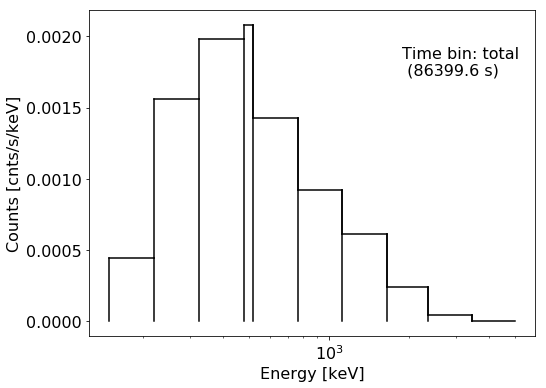

In [11]:
analysis3.dataset.plot_raw_spectrum()
plt.xscale('log')

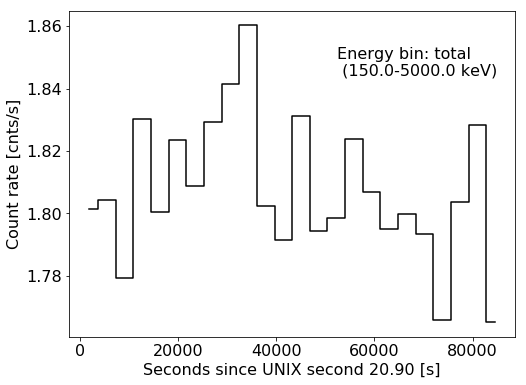

In [12]:
# light curve
analysis3.dataset.plot_lightcurve()

In [13]:
# definition of poitings (balloon stability + Earth rotation)
pointing1 = Pointing(dataset=analysis1.dataset,)
pointing2 = Pointing(dataset=analysis2.dataset,)
pointing3 = Pointing(dataset=analysis3.dataset,)
pointing4 = Pointing(dataset=analysis4.dataset,)

Text(0, 0.5, 'Zenith [deg]')

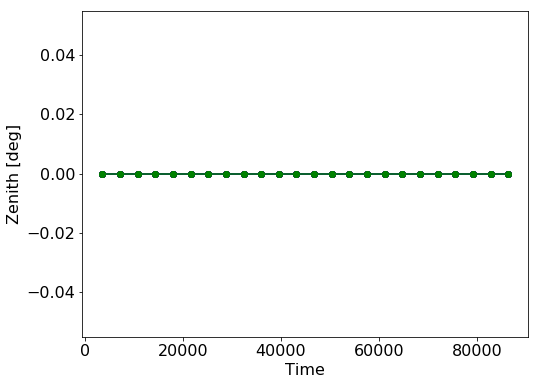

In [14]:
plt.plot(pointing1.cdtpoins,pointing1.zpoins[:,1],'o-')
plt.plot(pointing2.cdtpoins,pointing2.zpoins[:,1],'o-')
plt.plot(pointing3.cdtpoins,pointing3.zpoins[:,1],'o-')
plt.plot(pointing4.cdtpoins,pointing4.zpoins[:,1],'o-')
plt.xlabel('Time')
plt.ylabel('Zenith [deg]')

In [15]:
# background
background1 = BG(dataset=analysis1.dataset,mode='sim 6deg despina')
background2 = BG(dataset=analysis2.dataset,mode='sim 6deg despina')
background3 = BG(dataset=analysis3.dataset,mode='sim 6deg despina')
background4 = BG(dataset=analysis4.dataset,mode='sim 6deg despina')

Reading in simulated Ling-model (1973) background response for 6 deg CDS binning from despina only...
Reading in simulated Ling-model (1973) background response for 6 deg CDS binning from despina only...
Reading in simulated Ling-model (1973) background response for 6 deg CDS binning from despina only...
Reading in simulated Ling-model (1973) background response for 6 deg CDS binning from despina only...


In [16]:
# source position definition
l1,b1 = 180,0
l2,b2 = 180,18
l3,b3 = 180,-36
l4,b4 = 180,54

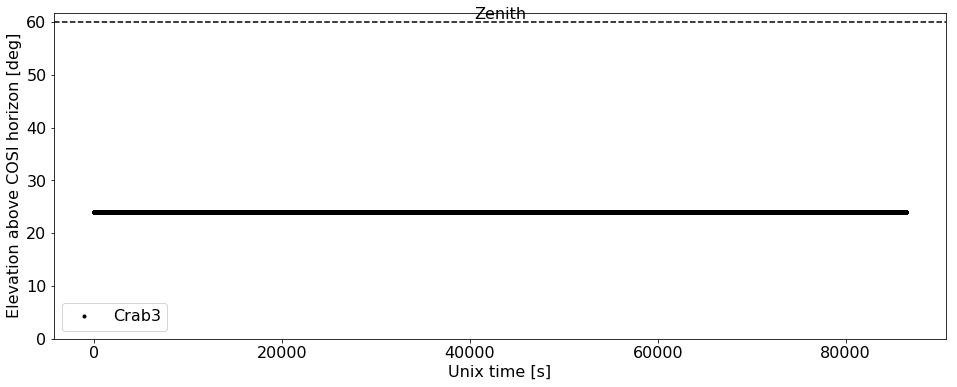

In [17]:
# plot elevation
analysis3.plot_elevation([l3],[b3],['Crab3'])

<h3>Reading in response (quite large, though)</h3>

In [18]:
rsp = response.SkyResponse(filename='response/RegularResponseGrid_Continuum_10bins_v1.npz',pixel_size=6)

Reading complete continuum response. This might take a while...
Done.

Creating general RMF matrices, stay tuned...



Done.

Creating general IRF. Wait for it...
Done.

Deleting full matrix.
Done. Now have fun.


In [19]:
rsp.rsp.response_grid_normed_efinal.shape

(30, 60, 30, 1145, 10)

<h3>Calculate response for a point source at the known position</h3>

In [20]:
rsp.calculate_PS_response(analysis1.dataset,
                          pointing1,l1,b1,1,
                          background=background1,
                          pixel_size=pixel_size)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...



Done.

Calculating averaged RMF for object at (l,b) = (180.0,0.0)


<h3>Fit to data to extract counts per unit time and energy:</h3>

In [21]:
result1 = fit(analysis1.dataset,
              pointing1,
              rsp,
              background1,
              #priors=np.array([[1e-6,1e8],[1e-6,1e4]]), # sky unconstrained, BG ~ 0
              verbose=True)

result1.MAP_solution(scipy=False)

Start optimising energy bin 1/10...

Energy range: 150-220 keV ...
Start optimising energy bin 2/10...

Energy range: 220-325 keV ...
Start optimising energy bin 3/10...

Energy range: 325-480 keV ...
Start optimising energy bin 4/10...

Energy range: 480-520 keV ...
Start optimising energy bin 5/10...

Energy range: 520-765 keV ...
Start optimising energy bin 6/10...

Energy range: 765-1120 keV ...
Start optimising energy bin 7/10...

Energy range: 1120-1650 keV ...
Start optimising energy bin 8/10...

Energy range: 1650-2350 keV ...
Start optimising energy bin 9/10...

Energy range: 2350-3450 keV ...
Start optimising energy bin 10/10...

Energy range: 3450-5000 keV ...

Initial log joint probability = -5457.93
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      11      -5452.84    0.00483043    0.00249939           1           1       16   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tol

<h3>Reading in "sky-only" simulation to compare extraction:</h3>

In [22]:
filename1sky = 'Crab_F10C_Z00.inc1.id1_CE0000-5000keV.tra.gz'
filename2sky = 'Crab_F10C_Z18.inc1.id1_CE0000-5000keV.tra.gz'
filename3sky = 'Crab_F10C_Z36.inc1.id1_CE0000-5000keV.tra.gz'
filename4sky = 'Crab_F10C_Z54.inc1.id1_CE0000-5000keV.tra.gz'

In [23]:
sky_filename1 = filename1
sky_data1 = COSIpy(data_dir,filename1sky)
sky_data1.read_COSI_DataSet()
sky_data1.dataset.time_binning_tags(time_bin_size=Delta_T) # everything in one time bin
sky_data1.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=6.)
sky_data1.dataset.get_binned_data()
# pure sky count rate
sim_sky_rate1 = np.sum(sky_data1.dataset.binned_data,axis=(0,2,3))/\
                (sky_data1.dataset.energies.energy_bin_wid*2*sky_data1.dataset.times.total_time)

In [24]:
sky_filename2 = filename2
sky_data2 = COSIpy(data_dir,filename2sky)
sky_data2.read_COSI_DataSet()
sky_data2.dataset.time_binning_tags(time_bin_size=Delta_T) # everything in one time bin
sky_data2.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=6.)
sky_data2.dataset.get_binned_data()
# pure sky count rate
sim_sky_rate2 = np.sum(sky_data2.dataset.binned_data,axis=(0,2,3))/\
                (sky_data2.dataset.energies.energy_bin_wid*2*sky_data2.dataset.times.total_time)

In [25]:
sky_filename3 = filename3
sky_data3 = COSIpy(data_dir,filename3sky)
sky_data3.read_COSI_DataSet()
sky_data3.dataset.time_binning_tags(time_bin_size=Delta_T) # everything in one time bin
sky_data3.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=6.)
sky_data3.dataset.get_binned_data()
# pure sky count rate
sim_sky_rate3 = np.sum(sky_data3.dataset.binned_data,axis=(0,2,3))/\
                (sky_data3.dataset.energies.energy_bin_wid*2*sky_data3.dataset.times.total_time)

In [26]:
sky_filename4 = filename4
sky_data4 = COSIpy(data_dir,filename4sky)
sky_data4.read_COSI_DataSet()
sky_data4.dataset.time_binning_tags(time_bin_size=Delta_T) # everything in one time bin
sky_data4.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=6.)
sky_data4.dataset.get_binned_data()
# pure sky count rate
sim_sky_rate4 = np.sum(sky_data4.dataset.binned_data,axis=(0,2,3))/\
                (sky_data4.dataset.energies.energy_bin_wid*2*sky_data4.dataset.times.total_time)

In [27]:
n_e = analysis1.dataset.energies.n_energy_bins

In [28]:
from COSIpy_tools import step_plot

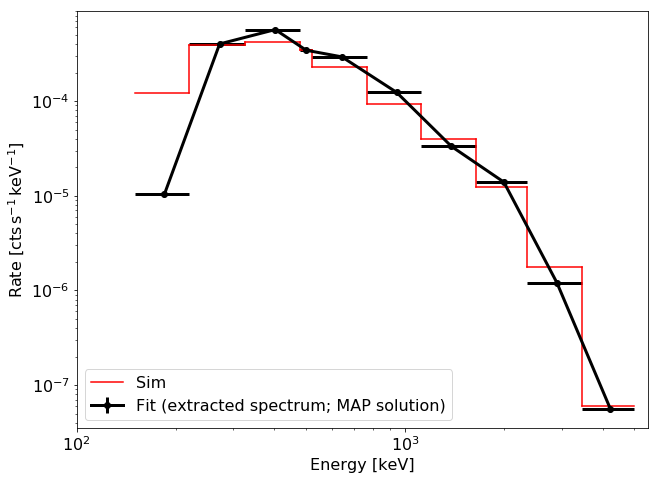

In [29]:
# fit
result1.plot_MAP_spectrum()
# simulation
step_plot(rsp.e_edges,sim_sky_rate1,color='red',plot_label='Sim') 
plt.legend()

<h3>Perfect fit (by definition).<br><br>
    Now estimating error bars:</h3>

In [30]:
result1.fit(iters=1000)

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...
Summary for energy bin 1/10:

Inference for Stan model: anon_model_666f42d8e949bfaf2d5a9470c57200bd.
1 chains, each with iter=1000; warmup=500; thin=1; 
post-warmup draws per chain=500, total post-warmup draws=500.

          mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
flux[1] 136.49    9.38  95.23  10.75  64.73 114.28 196.37 362.03    103   1.01
Abg[1]    0.95  3.6e-3   0.04   0.87   0.93   0.96   0.98   1.01    114   1.01

Samples were drawn using NUTS at Thu Jan 14 18:39:19 2021.
For each parameter, n_eff is a crude measure of effective sample size,
and Rhat is the potential scale reduction factor on split chains (at 
convergence, Rhat=1).
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-32

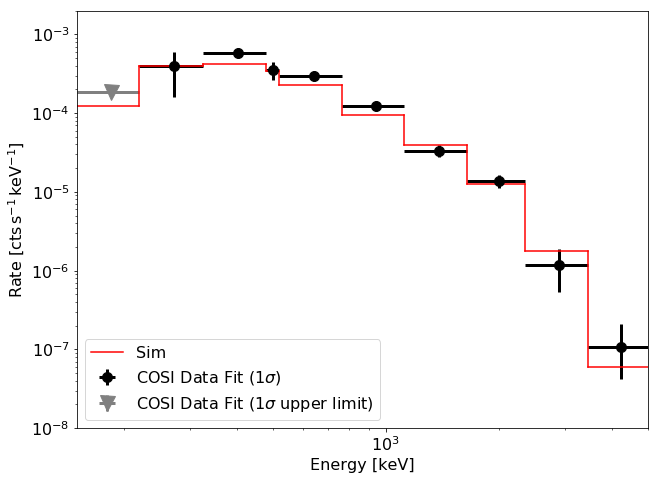

In [31]:
# fit
result1.plot_extracted_spectrum(ul=1,with_systematics=True)
# simulation
step_plot(rsp.e_edges,sim_sky_rate1,color='red',plot_label='Sim') 

plt.xlim(150,5000)
plt.ylim(1e-8,2e-3)
plt.legend()

In [61]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [62]:
%aimport response
%aimport fit
%aimport COSIpy_tools
%aimport COSIpy

In [63]:
%autoreload 1

In [64]:
%aimport

Modules to reload:
COSIpy COSIpy_tools fit response

Modules to skip:



In [65]:
from fit import *
from COSIpy import *

In [91]:
rsp.calculate_PS_response(analysis1.dataset,
                          pointing1,l1,b1,1,
                          background=background1,
                          pixel_size=pixel_size)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,0.0)


In [95]:
result1 = fit(analysis1.dataset,
              pointing1,
              rsp,
              background1,
              verbose=True)

In [96]:
result1.fit(use_emcee=True)

  4%|▎         | 35/1000 [00:00<00:02, 347.40it/s]

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...


  2%|▏         | 21/1000 [00:00<00:04, 201.99it/s]

Processing took 2.8 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.04e+02  6.79e+01  4.29e-01  3.43e+01  9.24e+01  1.73e+02  3.46e+02
        1:  9.62e-01  2.62e-02  8.80e-01  9.35e-01  9.64e-01  9.88e-01  1.02e+00
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-325 keV ...


  1%|▏         | 13/1000 [00:00<00:08, 123.35it/s]

Processing took 4.7 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  3.67e+03  3.47e+02  2.66e+03  3.33e+03  3.66e+03  4.02e+03  4.73e+03
        1:  7.58e-01  2.31e-02  6.91e-01  7.35e-01  7.59e-01  7.81e-01  8.26e-01
###################################################################
###################################################################

Start fitting energy bin 3/10...

Energy range: 325-480 keV ...


  2%|▏         | 15/1000 [00:00<00:06, 148.08it/s]

Processing took 6.3 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  7.55e+03  4.33e+02  6.34e+03  7.13e+03  7.55e+03  8.00e+03  8.81e+03
        1:  7.32e-01  1.58e-02  6.84e-01  7.16e-01  7.32e-01  7.47e-01  7.77e-01
###################################################################
###################################################################

Start fitting energy bin 4/10...

Energy range: 480-520 keV ...


  1%|          | 12/1000 [00:00<00:08, 113.03it/s]

Processing took 6.1 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.18e+03  1.77e+02  6.19e+02  9.97e+02  1.18e+03  1.35e+03  1.64e+03
        1:  8.41e-01  2.43e-02  7.73e-01  8.17e-01  8.41e-01  8.65e-01  9.21e-01
###################################################################
###################################################################

Start fitting energy bin 5/10...

Energy range: 520-765 keV ...


  1%|          | 10/1000 [00:00<00:10, 98.46it/s]

Processing took 8.9 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  6.20e+03  3.38e+02  5.17e+03  5.87e+03  6.22e+03  6.52e+03  7.12e+03
        1:  8.03e-01  1.14e-02  7.68e-01  7.92e-01  8.02e-01  8.14e-01  8.39e-01
###################################################################
###################################################################

Start fitting energy bin 6/10...

Energy range: 765-1120 keV ...


  1%|          | 10/1000 [00:00<00:10, 94.65it/s]

Processing took 7.9 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  3.80e+03  2.20e+02  3.15e+03  3.59e+03  3.80e+03  4.01e+03  4.50e+03
        1:  8.68e-01  8.85e-03  8.44e-01  8.60e-01  8.68e-01  8.77e-01  8.94e-01
###################################################################
###################################################################

Start fitting energy bin 7/10...

Energy range: 1120-1650 keV ...


  1%|          | 10/1000 [00:00<00:10, 98.54it/s]

Processing took 9.0 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.52e+03  1.83e+02  9.79e+02  1.33e+03  1.52e+03  1.70e+03  2.02e+03
        1:  9.46e-01  7.27e-03  9.27e-01  9.39e-01  9.46e-01  9.53e-01  9.67e-01
###################################################################
###################################################################

Start fitting energy bin 8/10...

Energy range: 1650-2350 keV ...


  1%|          | 11/1000 [00:00<00:09, 104.10it/s]

Processing took 8.7 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  8.60e+02  1.07e+02  5.60e+02  7.52e+02  8.57e+02  9.74e+02  1.18e+03
        1:  9.42e-01  8.80e-03  9.12e-01  9.33e-01  9.42e-01  9.50e-01  9.68e-01
###################################################################
###################################################################

Start fitting energy bin 9/10...

Energy range: 2350-3450 keV ...


  1%|          | 12/1000 [00:00<00:08, 117.55it/s]

Processing took 8.4 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.20e+02  4.15e+01  9.27e+00  7.89e+01  1.19e+02  1.60e+02  2.43e+02
        1:  9.71e-01  1.43e-02  9.31e-01  9.57e-01  9.71e-01  9.85e-01  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 10/10...

Energy range: 3450-5000 keV ...


100%|██████████| 1000/1000 [00:07<00:00, 136.63it/s]


Processing took 7.3 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.28e+01  8.11e+00  1.48e-02  4.54e+00  1.19e+01  2.06e+01  4.04e+01
        1:  9.65e-01  4.48e-02  8.41e-01  9.19e-01  9.64e-01  1.01e+00  1.09e+00
###################################################################


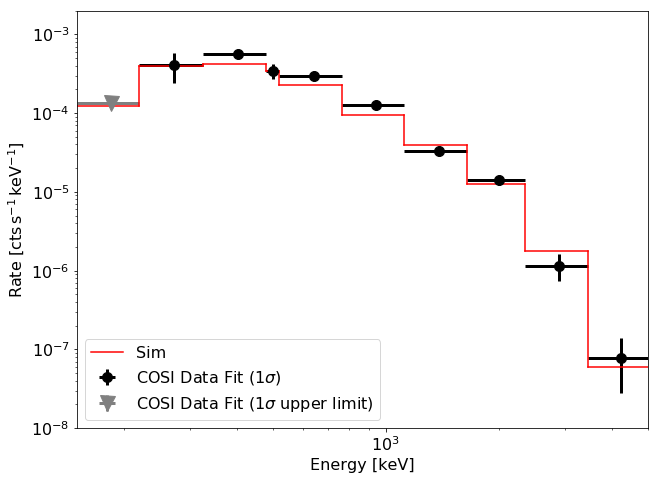

In [94]:
# fit
result1.plot_extracted_spectrum(ul=1,with_systematics=True)
# simulation
step_plot(rsp.e_edges,sim_sky_rate1,color='red',plot_label='Sim') 

plt.xlim(150,5000)
plt.ylim(1e-8,2e-3)
plt.legend()

In [97]:
rsp.calculate_PS_response(analysis2.dataset,
                          pointing2,l2,b2,1,
                          background=background2,
                          pixel_size=pixel_size,)

result2 = fit(analysis2.dataset,
              pointing2,
              rsp,
              background2,
              verbose=True)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,18.0)


In [98]:
result2.fit(iters=2000,use_emcee=True)

  2%|▏         | 33/2000 [00:00<00:06, 327.79it/s]

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...


  1%|          | 20/2000 [00:00<00:10, 197.01it/s]

Processing took 5.2 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  2.18e+02  9.06e+01  5.24e+00  1.27e+02  2.10e+02  3.12e+02  4.97e+02
        1:  9.25e-01  3.40e-02  8.22e-01  8.90e-01  9.28e-01  9.59e-01  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-325 keV ...


  1%|          | 16/2000 [00:00<00:13, 146.83it/s]

Processing took 8.8 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  2.42e+03  3.10e+02  1.54e+03  2.10e+03  2.42e+03  2.73e+03  3.34e+03
        1:  8.38e-01  2.12e-02  7.75e-01  8.17e-01  8.38e-01  8.60e-01  8.97e-01
###################################################################
###################################################################

Start fitting energy bin 3/10...

Energy range: 325-480 keV ...


  1%|          | 21/2000 [00:00<00:09, 203.91it/s]

Processing took 12.8 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  7.41e+03  4.17e+02  6.18e+03  7.00e+03  7.40e+03  7.83e+03  8.61e+03
        1:  7.32e-01  1.54e-02  6.87e-01  7.16e-01  7.33e-01  7.48e-01  7.76e-01
###################################################################
###################################################################

Start fitting energy bin 4/10...

Energy range: 480-520 keV ...


  1%|          | 16/2000 [00:00<00:12, 158.12it/s]

Processing took 10.6 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.25e+03  1.65e+02  7.21e+02  1.08e+03  1.26e+03  1.41e+03  1.72e+03
        1:  8.31e-01  2.36e-02  7.63e-01  8.09e-01  8.31e-01  8.55e-01  9.02e-01
###################################################################
###################################################################

Start fitting energy bin 5/10...

Energy range: 520-765 keV ...


  1%|          | 15/2000 [00:00<00:13, 146.05it/s]

Processing took 13.3 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  5.95e+03  3.09e+02  5.09e+03  5.63e+03  5.94e+03  6.26e+03  6.86e+03
        1:  8.10e-01  1.02e-02  7.80e-01  8.00e-01  8.10e-01  8.20e-01  8.40e-01
###################################################################
###################################################################

Start fitting energy bin 6/10...

Energy range: 765-1120 keV ...


  1%|          | 14/2000 [00:00<00:15, 132.06it/s]

Processing took 14.2 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  3.56e+03  2.24e+02  2.92e+03  3.34e+03  3.55e+03  3.78e+03  4.30e+03
        1:  8.76e-01  8.68e-03  8.49e-01  8.67e-01  8.76e-01  8.85e-01  9.04e-01
###################################################################
###################################################################

Start fitting energy bin 7/10...

Energy range: 1120-1650 keV ...


  1%|          | 14/2000 [00:00<00:14, 138.64it/s]

Processing took 16.3 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.91e+03  1.95e+02  1.32e+03  1.71e+03  1.91e+03  2.11e+03  2.45e+03
        1:  9.33e-01  8.02e-03  9.11e-01  9.24e-01  9.33e-01  9.41e-01  9.58e-01
###################################################################
###################################################################

Start fitting energy bin 8/10...

Energy range: 1650-2350 keV ...


  1%|          | 14/2000 [00:00<00:15, 130.55it/s]

Processing took 14.7 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  9.02e+02  1.11e+02  5.68e+02  7.89e+02  9.06e+02  1.01e+03  1.22e+03
        1:  9.39e-01  9.36e-03  9.13e-01  9.29e-01  9.39e-01  9.48e-01  9.65e-01
###################################################################
###################################################################

Start fitting energy bin 9/10...

Energy range: 2350-3450 keV ...


  1%|          | 18/2000 [00:00<00:11, 172.78it/s]

Processing took 14.9 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.56e+02  4.24e+01  4.14e+01  1.12e+02  1.57e+02  1.98e+02  2.75e+02
        1:  9.62e-01  1.42e-02  9.20e-01  9.47e-01  9.62e-01  9.76e-01  1.00e+00
###################################################################
###################################################################

Start fitting energy bin 10/10...

Energy range: 3450-5000 keV ...


100%|██████████| 2000/2000 [00:12<00:00, 155.95it/s]


Processing took 12.8 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  2.79e+01  1.05e+01  1.91e+00  1.78e+01  2.73e+01  3.85e+01  6.27e+01
        1:  9.21e-01  4.63e-02  7.72e-01  8.73e-01  9.21e-01  9.67e-01  1.06e+00
###################################################################


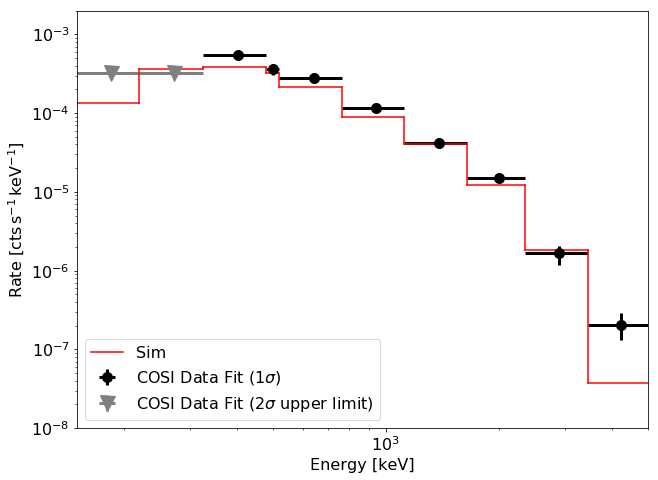

In [100]:
# fit
result2.plot_extracted_spectrum(ul=2,with_systematics=True)
# simulation
step_plot(rsp.e_edges,sim_sky_rate2,color='red',plot_label='Sim') 

plt.xlim(150,5000)
plt.ylim(1e-8,2e-3)
plt.legend()

In [101]:
rsp.calculate_PS_response(analysis3.dataset,
                          pointing3,l3,b3,1,
                          background=background3,
                          pixel_size=pixel_size,)

result3 = fit(analysis3.dataset,
              pointing3,
              rsp,
              background3,
              verbose=True)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-36.0)


In [102]:
result3.fit(iters=2000,use_emcee=True)

  1%|▏         | 27/2000 [00:00<00:07, 260.48it/s]

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...


  1%|          | 21/2000 [00:00<00:09, 202.94it/s]

Processing took 5.3 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.64e+02  8.35e+01  1.31e+00  7.72e+01  1.59e+02  2.50e+02  4.46e+02
        1:  9.39e-01  3.43e-02  8.31e-01  9.04e-01  9.40e-01  9.73e-01  1.03e+00
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-325 keV ...


  1%|          | 14/2000 [00:00<00:14, 139.14it/s]

Processing took 8.5 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.56e+03  3.04e+02  6.25e+02  1.25e+03  1.56e+03  1.87e+03  2.38e+03
        1:  8.90e-01  2.21e-02  8.30e-01  8.68e-01  8.89e-01  9.12e-01  9.58e-01
###################################################################
###################################################################

Start fitting energy bin 3/10...

Energy range: 325-480 keV ...


  0%|          | 9/2000 [00:00<00:24, 81.68it/s]

Processing took 12.4 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  5.79e+03  3.65e+02  4.77e+03  5.41e+03  5.80e+03  6.15e+03  6.82e+03
        1:  7.81e-01  1.43e-02  7.42e-01  7.67e-01  7.81e-01  7.96e-01  8.24e-01
###################################################################
###################################################################

Start fitting energy bin 4/10...

Energy range: 480-520 keV ...


  1%|          | 14/2000 [00:00<00:14, 139.96it/s]

Processing took 11.3 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.30e+03  1.71e+02  8.26e+02  1.13e+03  1.31e+03  1.48e+03  1.80e+03
        1:  8.19e-01  2.44e-02  7.49e-01  7.95e-01  8.18e-01  8.44e-01  8.93e-01
###################################################################
###################################################################

Start fitting energy bin 5/10...

Energy range: 520-765 keV ...


  1%|          | 16/2000 [00:00<00:12, 155.37it/s]

Processing took 13.1 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  4.08e+03  2.61e+02  3.20e+03  3.82e+03  4.09e+03  4.34e+03  4.76e+03
        1:  8.65e-01  9.12e-03  8.39e-01  8.56e-01  8.65e-01  8.74e-01  8.95e-01
###################################################################
###################################################################

Start fitting energy bin 6/10...

Energy range: 765-1120 keV ...


  1%|          | 13/2000 [00:00<00:15, 129.01it/s]

Processing took 13.1 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  2.63e+03  2.06e+02  2.06e+03  2.42e+03  2.63e+03  2.83e+03  3.31e+03
        1:  9.07e-01  7.95e-03  8.83e-01  8.99e-01  9.07e-01  9.15e-01  9.30e-01
###################################################################
###################################################################

Start fitting energy bin 7/10...

Energy range: 1120-1650 keV ...


  1%|          | 15/2000 [00:00<00:13, 144.29it/s]

Processing took 15.1 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.55e+03  1.99e+02  9.79e+02  1.35e+03  1.55e+03  1.75e+03  2.15e+03
        1:  9.45e-01  8.01e-03  9.22e-01  9.37e-01  9.45e-01  9.53e-01  9.68e-01
###################################################################
###################################################################

Start fitting energy bin 8/10...

Energy range: 1650-2350 keV ...


  1%|          | 15/2000 [00:00<00:13, 147.17it/s]

Processing took 14.0 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  2.89e+02  1.08e+02  1.28e+01  1.78e+02  2.87e+02  3.98e+02  6.17e+02
        1:  9.80e-01  9.07e-03  9.50e-01  9.71e-01  9.80e-01  9.89e-01  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 9/10...

Energy range: 2350-3450 keV ...


  1%|          | 17/2000 [00:00<00:11, 169.36it/s]

Processing took 14.4 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.14e+02  3.92e+01  1.03e+01  7.48e+01  1.14e+02  1.53e+02  2.29e+02
        1:  9.72e-01  1.46e-02  9.33e-01  9.58e-01  9.72e-01  9.88e-01  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 10/10...

Energy range: 3450-5000 keV ...


100%|██████████| 2000/2000 [00:13<00:00, 147.22it/s]


Processing took 13.6 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.24e+01  7.16e+00  8.39e-02  4.94e+00  1.18e+01  1.97e+01  3.54e+01
        1:  9.67e-01  4.18e-02  8.48e-01  9.26e-01  9.67e-01  1.01e+00  1.09e+00
###################################################################


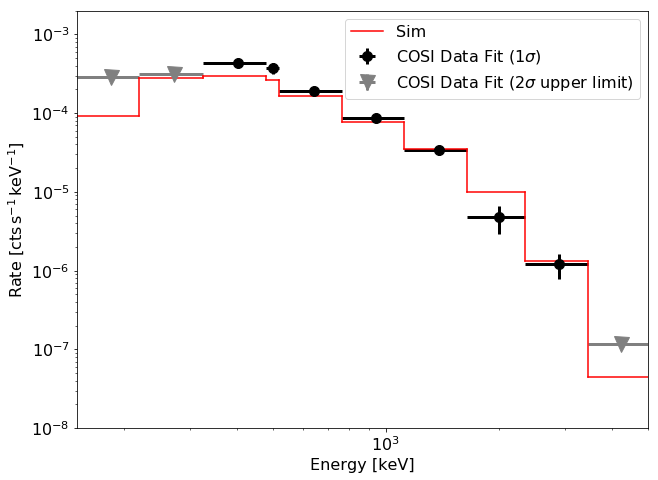

In [105]:
# fit
result3.plot_extracted_spectrum(ul=2,with_systematics=True)
# simulation
step_plot(rsp.e_edges,sim_sky_rate3,color='red',plot_label='Sim') 

plt.xlim(150,5000)
plt.ylim(1e-8,2e-3)
plt.legend()

In [106]:
rsp.calculate_PS_response(analysis4.dataset,
                          pointing4,l4,b4,1,
                          background=background4,
                          pixel_size=pixel_size)

result4 = fit(analysis4.dataset,
              pointing4,
              rsp,
              background4,
              verbose=True)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,54.0)


In [107]:
result4.fit(iters=2000,use_emcee=True)

  2%|▏         | 34/2000 [00:00<00:05, 339.62it/s]

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...


  1%|          | 21/2000 [00:00<00:09, 202.84it/s]

Processing took 5.1 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  9.55e+01  6.06e+01  3.08e-01  3.35e+01  8.69e+01  1.58e+02  3.09e+02
        1:  9.58e-01  2.98e-02  8.57e-01  9.27e-01  9.63e-01  9.87e-01  1.02e+00
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-325 keV ...


  1%|          | 15/2000 [00:00<00:14, 140.18it/s]

Processing took 8.5 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  9.67e+02  2.46e+02  2.80e+02  7.25e+02  9.61e+02  1.22e+03  1.70e+03
        1:  9.23e-01  2.01e-02  8.62e-01  9.03e-01  9.24e-01  9.43e-01  9.86e-01
###################################################################
###################################################################

Start fitting energy bin 3/10...

Energy range: 325-480 keV ...


  1%|          | 15/2000 [00:00<00:13, 147.44it/s]

Processing took 12.3 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  2.14e+03  3.08e+02  1.27e+03  1.83e+03  2.14e+03  2.45e+03  3.02e+03
        1:  9.11e-01  1.34e-02  8.74e-01  8.97e-01  9.11e-01  9.24e-01  9.49e-01
###################################################################
###################################################################

Start fitting energy bin 4/10...

Energy range: 480-520 keV ...


  0%|          | 10/2000 [00:00<00:20, 97.48it/s]

Processing took 11.6 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  5.30e+02  1.45e+02  1.42e+02  3.82e+02  5.28e+02  6.78e+02  9.32e+02
        1:  9.20e-01  2.37e-02  8.54e-01  8.96e-01  9.20e-01  9.44e-01  9.90e-01
###################################################################
###################################################################

Start fitting energy bin 5/10...

Energy range: 520-765 keV ...


  1%|          | 15/2000 [00:00<00:13, 146.44it/s]

Processing took 13.9 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.62e+03  2.38e+02  8.65e+02  1.38e+03  1.63e+03  1.85e+03  2.30e+03
        1:  9.42e-01  9.21e-03  9.15e-01  9.33e-01  9.42e-01  9.51e-01  9.71e-01
###################################################################
###################################################################

Start fitting energy bin 6/10...

Energy range: 765-1120 keV ...


  1%|          | 14/2000 [00:00<00:14, 134.17it/s]

Processing took 13.2 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.67e+03  2.05e+02  1.06e+03  1.47e+03  1.67e+03  1.87e+03  2.36e+03
        1:  9.39e-01  8.67e-03  9.15e-01  9.30e-01  9.39e-01  9.47e-01  9.65e-01
###################################################################
###################################################################

Start fitting energy bin 7/10...

Energy range: 1120-1650 keV ...


  1%|          | 15/2000 [00:00<00:14, 140.46it/s]

Processing took 15.1 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  9.80e+02  1.83e+02  4.41e+02  7.96e+02  9.87e+02  1.16e+03  1.55e+03
        1:  9.65e-01  7.74e-03  9.42e-01  9.57e-01  9.65e-01  9.72e-01  9.88e-01
###################################################################
###################################################################

Start fitting energy bin 8/10...

Energy range: 1650-2350 keV ...


  1%|          | 11/2000 [00:00<00:18, 108.11it/s]

Processing took 14.1 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.16e+02  7.55e+01  7.23e-01  3.78e+01  1.05e+02  1.95e+02  3.80e+02
        1:  9.92e-01  7.73e-03  9.66e-01  9.84e-01  9.92e-01  1.00e+00  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 9/10...

Energy range: 2350-3450 keV ...


  1%|          | 12/2000 [00:00<00:16, 117.74it/s]

Processing took 17.9 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.80e+01  1.60e+01  3.99e-02  3.10e+00  1.35e+01  3.36e+01  8.24e+01
        1:  9.97e-01  1.20e-02  9.61e-01  9.85e-01  9.98e-01  1.01e+00  1.03e+00
###################################################################
###################################################################

Start fitting energy bin 10/10...

Energy range: 3450-5000 keV ...


100%|██████████| 2000/2000 [00:14<00:00, 134.00it/s]


Processing took 14.9 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.54e+01  8.85e+00  6.73e-02  6.08e+00  1.46e+01  2.48e+01  4.38e+01
        1:  9.57e-01  4.34e-02  8.23e-01  9.15e-01  9.57e-01  1.00e+00  1.09e+00
###################################################################


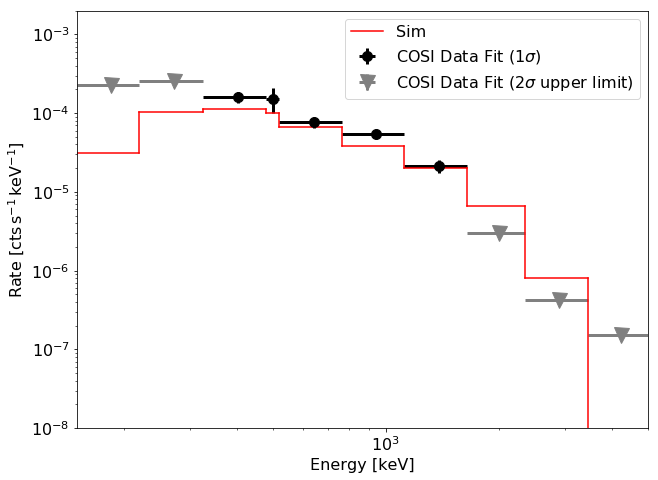

In [109]:
# fit
result4.plot_extracted_spectrum(ul=2,with_systematics=True)
# simulation
step_plot(rsp.e_edges,sim_sky_rate4,color='red',plot_label='Sim') 

plt.xlim(150,5000)
plt.ylim(1e-8,2e-3)
plt.legend()

In [32]:
rsp.calculate_PS_response(analysis1.dataset,
                          pointing1,l1,b1,1,
                          background=background1,
                          pixel_size=pixel_size)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...



Done.

Calculating averaged RMF for object at (l,b) = (180.0,0.0)


<h3>How to fit this count rate spectrum to get spectral parameter in physical (model) space: (cf. presentation)</h3>

In [33]:
from spectral_shapes import *

<h3>$\mathrm{ph\,s^{-1}\,cm^{-2}\,keV^{-1}} \Rightarrow \mathrm{ph\,s^{-1}\,cm^{-2}}$:</h3>

In [34]:
crab_params = np.array([3.90e-6,-2.23,100,5000])

In [35]:
prior_crab = {0: ('truncated_normal_prior',1e-9,1e8,0,np.inf,r'$C_0$'),
              1: ('normal_prior',-2.0,5.0,r'$\alpha$')}
function = 'powerlaw'

In [36]:
result1.fit_spectrum(function,prior_crab,e_select=np.arange(10),with_systematics=True)

  4%|▍         | 85/2000 [00:00<00:02, 842.60it/s]

Fitting spectrum ... with some info included here ...


100%|██████████| 2000/2000 [00:01<00:00, 1016.82it/s]


Processing took 2.0 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
    $C_0$:  4.78e-06  2.66e-07  3.87e-06  4.52e-06  4.79e-06  5.04e-06  5.49e-06
 $\alpha$: -2.39e+00  9.71e-02 -2.68e+00 -2.48e+00 -2.39e+00 -2.29e+00 -2.12e+00


Chi2 (dof): 10.0 (8)


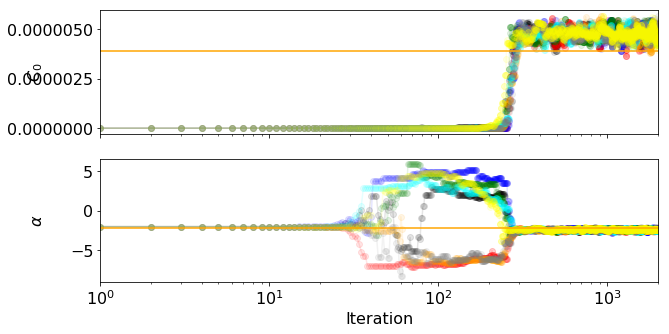

In [37]:
result1.plot_parameter_chains(truths=list(crab_params))

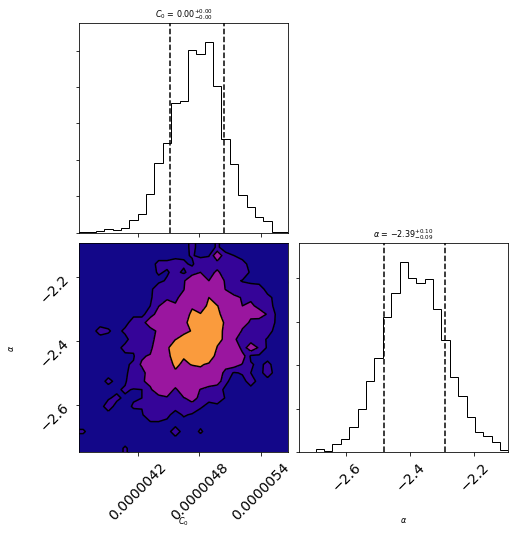

In [38]:
result1.corner_plot(truths=list(crab_params))

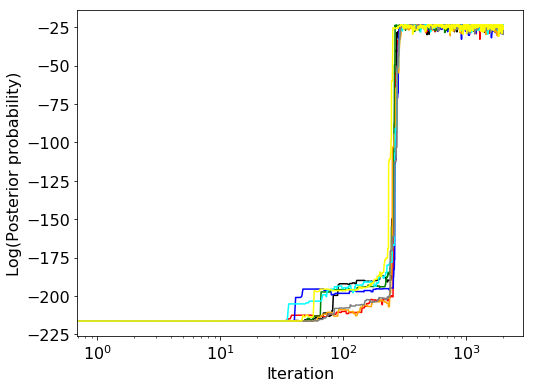

In [39]:
result1.plot_posterior_chains()

In [40]:
result1.calculate_model_posteriors()

14000 16000


(1e-08, 0.0012420743234350545)

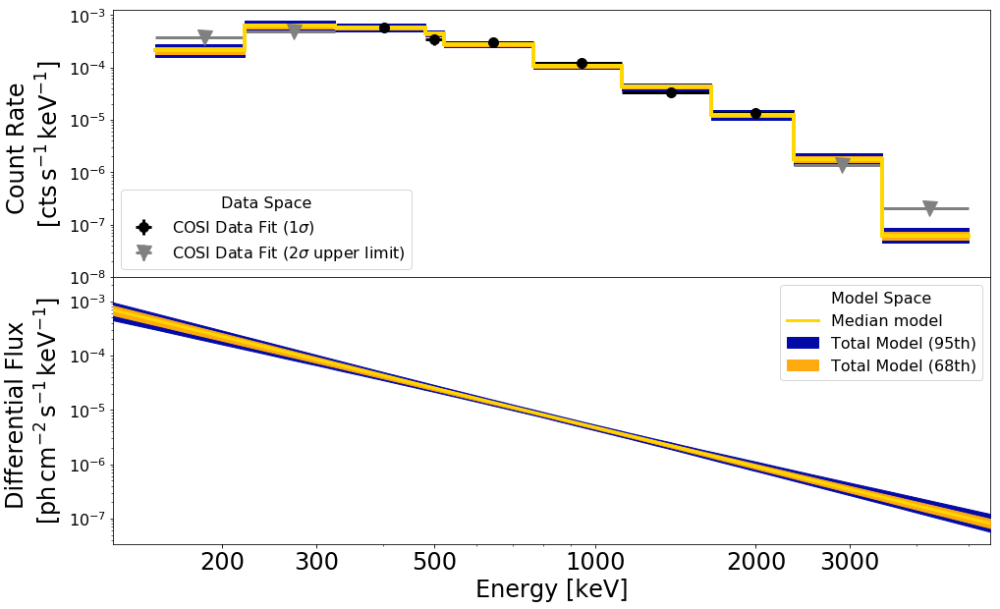

In [41]:
pc = result1.plot_posterior_spectrum(model_mode='flux',with_systematics=True,ul=2)
pc[0].set_ylim(1e-8,)

#pc[0].set_xscale('linear')
#pc[1].set_yscale('linear')

In [71]:
result2.fit_spectrum(function,prior_crab,e_select=np.arange(10),with_systematics=True,iters=5000,)

  2%|▏         | 81/5000 [00:00<00:06, 807.50it/s]

Fitting spectrum ... with some info included here ...


100%|██████████| 5000/5000 [00:04<00:00, 1064.89it/s]


Processing took 4.7 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
    $C_0$:  4.93e-06  2.35e-07  4.18e-06  4.70e-06  4.93e-06  5.16e-06  5.62e-06
 $\alpha$: -2.27e+00  8.70e-02 -2.55e+00 -2.36e+00 -2.27e+00 -2.19e+00 -2.00e+00


Chi2 (dof): 5.9 (8)


In [72]:
result2.calculate_model_posteriors()

38000 40000


(1e-08, 0.0011073747194468163)

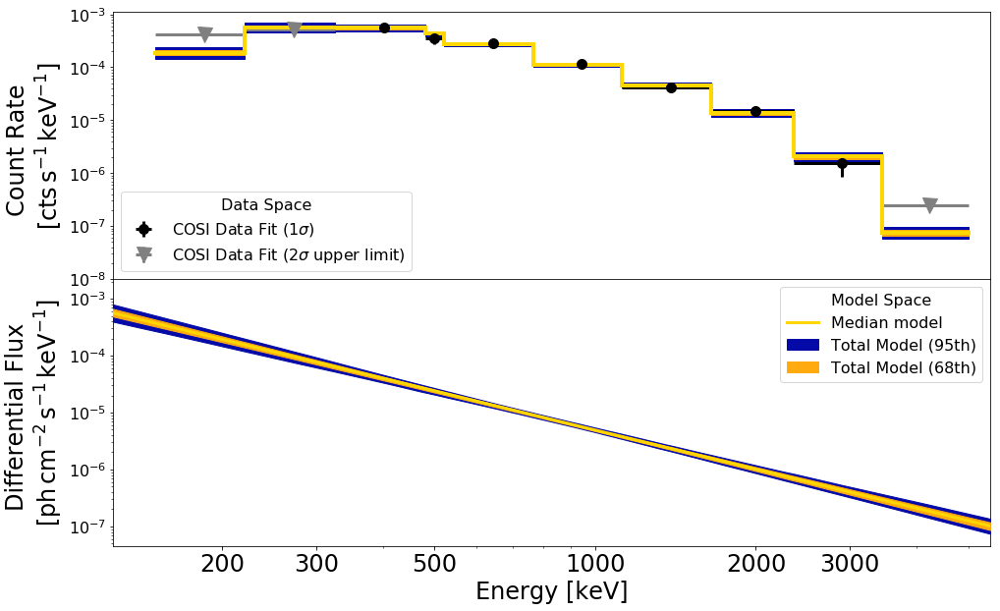

In [73]:
pc = result2.plot_posterior_spectrum(model_mode='flux',with_systematics=True,ul=2)
pc[0].set_ylim(1e-8,)

#pc[0].set_xscale('linear')
#pc[1].set_yscale('linear')

In [74]:
result3.fit_spectrum(function,prior_crab,e_select=np.arange(10),with_systematics=True,iters=5000,)

  2%|▏         | 80/5000 [00:00<00:06, 789.58it/s]

Fitting spectrum ... with some info included here ...


100%|██████████| 5000/5000 [00:05<00:00, 969.57it/s] 


Processing took 5.2 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
    $C_0$:  3.44e-06  2.19e-07  2.79e-06  3.22e-06  3.44e-06  3.66e-06  4.09e-06
 $\alpha$: -2.39e+00  1.15e-01 -2.73e+00 -2.51e+00 -2.39e+00 -2.27e+00 -2.07e+00


Chi2 (dof): 7.6 (8)


In [75]:
result3.calculate_model_posteriors()

38000 40000


(1e-08, 0.0009341046791080486)

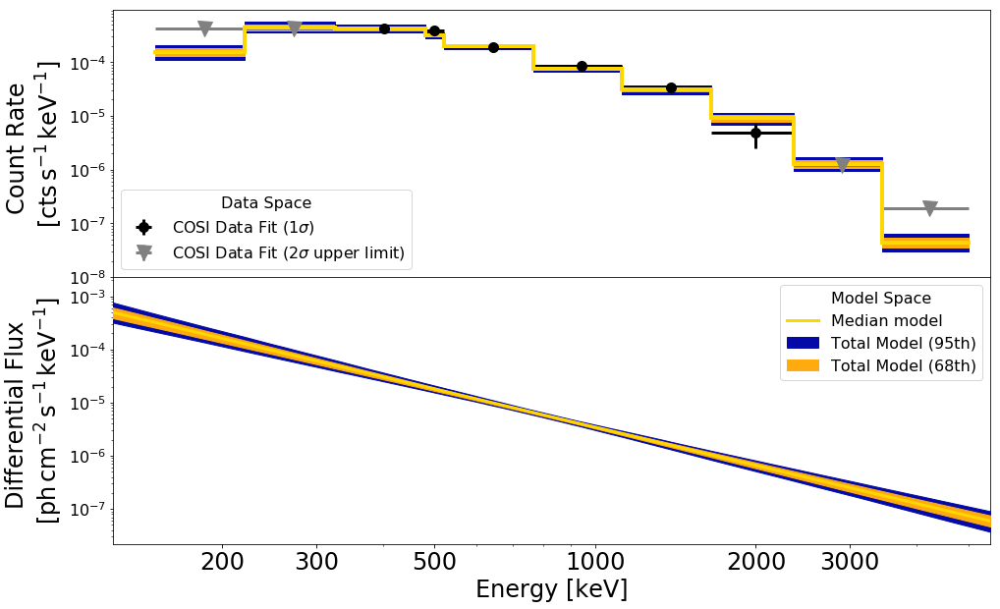

In [76]:
pc = result3.plot_posterior_spectrum(model_mode='flux',with_systematics=True,ul=2)
pc[0].set_ylim(1e-8,)

#pc[0].set_xscale('linear')
#pc[1].set_yscale('linear')

In [123]:
result4.fit_spectrum(function,prior_crab,e_select=np.arange(1,9),with_systematics=True,iters=5000,)

  2%|▏         | 78/5000 [00:00<00:06, 772.40it/s]

Fitting spectrum ... with some info included here ...


100%|██████████| 5000/5000 [00:05<00:00, 941.78it/s]


Processing took 5.3 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
    $C_0$:  3.52e-06  2.91e-07  2.59e-06  3.23e-06  3.52e-06  3.80e-06  4.41e-06
 $\alpha$: -2.63e+00  1.39e-01 -3.08e+00 -2.77e+00 -2.63e+00 -2.49e+00 -2.23e+00


Chi2 (dof): 15.5 (6)


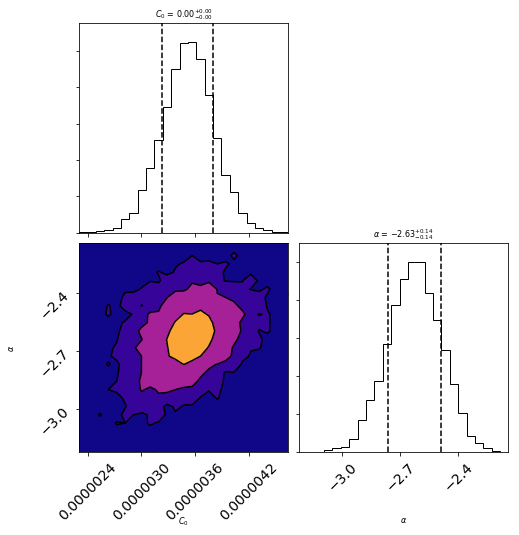

In [124]:
result4.corner_plot()

In [125]:
result4.calculate_model_posteriors()

38000 40000


(1e-08, 0.00040528645085504387)

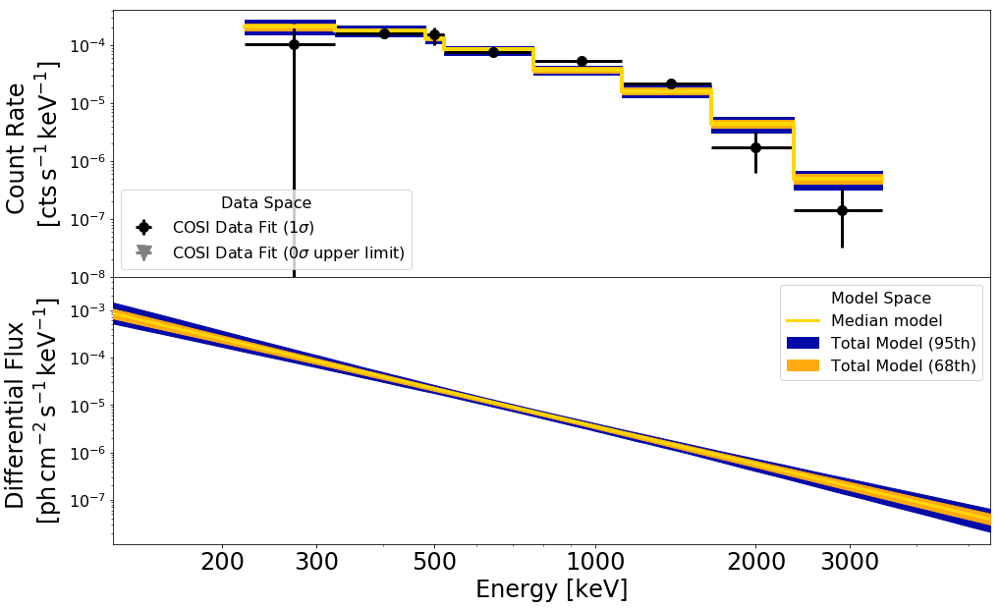

In [126]:
pc = result4.plot_posterior_spectrum(model_mode='flux',with_systematics=True,ul=0)
pc[0].set_ylim(1e-8,)

#pc[0].set_xscale('linear')
#pc[1].set_yscale('linear')

In [42]:
l_gridg = np.linspace(180-75,180+75,14)
b_gridg = np.linspace(0-75,0+75,14)

l_grid = l_gridg[0:-1]+np.diff(l_gridg[0:-1])[0]/2
b_grid = b_gridg[0:-1]+np.diff(b_gridg[0:-1])[0]/2

l_grid[l_grid<-180] += 360

L_GRIDg, B_GRIDg = np.meshgrid(l_gridg,b_gridg)
L_GRID, B_GRID = np.meshgrid(l_grid,b_grid)

In [43]:
result1.TS_map([L_GRID,B_GRID],scipy=False)

Fitting background only...


Now fitting object at (l,b) = (110.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-69.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -69.23076923076923
Now fitting object at (l,b) = (122.3,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-69.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -69.23076923076923
Now fitting object at (l,b) = (133.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-69.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -69.23076923076923
Now fitting object at (l,b) = (145.4,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-69.2)


Something went wrong with the fit, ignoring grid point  145.3846153846154 -69.23076923076923
Now fitting object at (l,b) = (156.9,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-69.2)


Something went wrong with the fit, ignoring grid point  156.92307692307693 -69.23076923076923
Now fitting object at (l,b) = (168.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-69.2)


Something went wrong with the fit, ignoring grid point  168.46153846153845 -69.23076923076923
Now fitting object at (l,b) = (180.0,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-69.2)


Something went wrong with the fit, ignoring grid point  180.0 -69.23076923076923
Now fitting object at (l,b) = (191.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-69.2)


Something went wrong with the fit, ignoring grid point  191.53846153846155 -69.23076923076923
Now fitting object at (l,b) = (203.1,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-69.2)


Something went wrong with the fit, ignoring grid point  203.0769230769231 -69.23076923076923
Now fitting object at (l,b) = (214.6,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-69.2)


Something went wrong with the fit, ignoring grid point  214.6153846153846 -69.23076923076923
Now fitting object at (l,b) = (226.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-69.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -69.23076923076923
Now fitting object at (l,b) = (237.7,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-69.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -69.23076923076923
Now fitting object at (l,b) = (249.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-69.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -69.23076923076923
Now fitting object at (l,b) = (110.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-57.7)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -57.69230769230769
Now fitting object at (l,b) = (122.3,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-57.7)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -57.69230769230769
Now fitting object at (l,b) = (133.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-57.7)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -57.69230769230769
Now fitting object at (l,b) = (145.4,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-57.7)


Something went wrong with the fit, ignoring grid point  145.3846153846154 -57.69230769230769
Now fitting object at (l,b) = (156.9,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-57.7)


Something went wrong with the fit, ignoring grid point  156.92307692307693 -57.69230769230769
Now fitting object at (l,b) = (168.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-57.7)


Now fitting object at (l,b) = (180.0,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-57.7)


Now fitting object at (l,b) = (191.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-57.7)


Now fitting object at (l,b) = (203.1,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-57.7)


Something went wrong with the fit, ignoring grid point  203.0769230769231 -57.69230769230769
Now fitting object at (l,b) = (214.6,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-57.7)


Something went wrong with the fit, ignoring grid point  214.6153846153846 -57.69230769230769
Now fitting object at (l,b) = (226.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-57.7)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -57.69230769230769
Now fitting object at (l,b) = (237.7,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-57.7)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -57.69230769230769
Now fitting object at (l,b) = (249.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-57.7)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -57.69230769230769
Now fitting object at (l,b) = (110.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-46.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -46.153846153846146
Now fitting object at (l,b) = (122.3,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-46.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -46.153846153846146
Now fitting object at (l,b) = (133.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-46.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -46.153846153846146
Now fitting object at (l,b) = (145.4,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-46.2)


Now fitting object at (l,b) = (156.9,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-46.2)


Now fitting object at (l,b) = (168.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-46.2)


Now fitting object at (l,b) = (180.0,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-46.2)


Now fitting object at (l,b) = (191.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-46.2)


Now fitting object at (l,b) = (203.1,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-46.2)


Now fitting object at (l,b) = (214.6,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-46.2)


Now fitting object at (l,b) = (226.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-46.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -46.153846153846146
Now fitting object at (l,b) = (237.7,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-46.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -46.153846153846146
Now fitting object at (l,b) = (249.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-46.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -46.153846153846146
Now fitting object at (l,b) = (110.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-34.6)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -34.61538461538461
Now fitting object at (l,b) = (122.3,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-34.6)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -34.61538461538461
Now fitting object at (l,b) = (133.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-34.6)


Now fitting object at (l,b) = (145.4,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-34.6)


Now fitting object at (l,b) = (156.9,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-34.6)


Now fitting object at (l,b) = (168.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-34.6)


Now fitting object at (l,b) = (180.0,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-34.6)


Now fitting object at (l,b) = (191.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-34.6)


Now fitting object at (l,b) = (203.1,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-34.6)


Now fitting object at (l,b) = (214.6,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-34.6)


Now fitting object at (l,b) = (226.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-34.6)


Now fitting object at (l,b) = (237.7,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-34.6)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -34.61538461538461
Now fitting object at (l,b) = (249.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-34.6)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -34.61538461538461
Now fitting object at (l,b) = (110.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-23.1)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -23.076923076923077
Now fitting object at (l,b) = (122.3,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-23.1)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -23.076923076923077
Now fitting object at (l,b) = (133.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-23.1)


Now fitting object at (l,b) = (145.4,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-23.1)


Now fitting object at (l,b) = (156.9,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-23.1)


Now fitting object at (l,b) = (168.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-23.1)


Now fitting object at (l,b) = (180.0,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-23.1)


Now fitting object at (l,b) = (191.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-23.1)


Now fitting object at (l,b) = (203.1,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-23.1)


Now fitting object at (l,b) = (214.6,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-23.1)


Now fitting object at (l,b) = (226.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-23.1)


Now fitting object at (l,b) = (237.7,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-23.1)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -23.076923076923077
Now fitting object at (l,b) = (249.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-23.1)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -23.076923076923077
Now fitting object at (l,b) = (110.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-11.5)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -11.538461538461537
Now fitting object at (l,b) = (122.3,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-11.5)


Now fitting object at (l,b) = (133.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-11.5)


Now fitting object at (l,b) = (145.4,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-11.5)


Now fitting object at (l,b) = (156.9,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-11.5)


Now fitting object at (l,b) = (168.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-11.5)


Now fitting object at (l,b) = (180.0,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-11.5)


Now fitting object at (l,b) = (191.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-11.5)


Now fitting object at (l,b) = (203.1,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-11.5)


Now fitting object at (l,b) = (214.6,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-11.5)


Now fitting object at (l,b) = (226.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-11.5)


Now fitting object at (l,b) = (237.7,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-11.5)


Now fitting object at (l,b) = (249.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-11.5)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -11.538461538461537
Now fitting object at (l,b) = (110.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-0.0)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -3.552713678800501e-15
Now fitting object at (l,b) = (122.3,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-0.0)


Now fitting object at (l,b) = (133.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-0.0)


Now fitting object at (l,b) = (145.4,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-0.0)


Now fitting object at (l,b) = (156.9,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-0.0)


Now fitting object at (l,b) = (168.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-0.0)


Now fitting object at (l,b) = (180.0,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-0.0)


Now fitting object at (l,b) = (191.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-0.0)


Now fitting object at (l,b) = (203.1,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-0.0)


Now fitting object at (l,b) = (214.6,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-0.0)


Now fitting object at (l,b) = (226.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-0.0)


Now fitting object at (l,b) = (237.7,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-0.0)


Now fitting object at (l,b) = (249.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-0.0)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -3.552713678800501e-15
Now fitting object at (l,b) = (110.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,11.5)


Something went wrong with the fit, ignoring grid point  110.76923076923077 11.538461538461544
Now fitting object at (l,b) = (122.3,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,11.5)


Now fitting object at (l,b) = (133.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,11.5)


Now fitting object at (l,b) = (145.4,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,11.5)


Now fitting object at (l,b) = (156.9,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,11.5)


Now fitting object at (l,b) = (168.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,11.5)


Now fitting object at (l,b) = (180.0,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,11.5)


Now fitting object at (l,b) = (191.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,11.5)


Now fitting object at (l,b) = (203.1,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,11.5)


Now fitting object at (l,b) = (214.6,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,11.5)


Now fitting object at (l,b) = (226.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,11.5)


Now fitting object at (l,b) = (237.7,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,11.5)


Now fitting object at (l,b) = (249.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,11.5)


Something went wrong with the fit, ignoring grid point  249.23076923076923 11.538461538461544
Now fitting object at (l,b) = (110.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,23.1)


Something went wrong with the fit, ignoring grid point  110.76923076923077 23.076923076923077
Now fitting object at (l,b) = (122.3,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,23.1)


Something went wrong with the fit, ignoring grid point  122.30769230769229 23.076923076923077
Now fitting object at (l,b) = (133.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,23.1)


Now fitting object at (l,b) = (145.4,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,23.1)


Now fitting object at (l,b) = (156.9,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,23.1)


Now fitting object at (l,b) = (168.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,23.1)


Now fitting object at (l,b) = (180.0,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,23.1)


Now fitting object at (l,b) = (191.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,23.1)


Now fitting object at (l,b) = (203.1,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,23.1)


Now fitting object at (l,b) = (214.6,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,23.1)


Now fitting object at (l,b) = (226.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,23.1)


Now fitting object at (l,b) = (237.7,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,23.1)


Something went wrong with the fit, ignoring grid point  237.69230769230768 23.076923076923077
Now fitting object at (l,b) = (249.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,23.1)


Something went wrong with the fit, ignoring grid point  249.23076923076923 23.076923076923077
Now fitting object at (l,b) = (110.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,34.6)


Something went wrong with the fit, ignoring grid point  110.76923076923077 34.61538461538461
Now fitting object at (l,b) = (122.3,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,34.6)


Something went wrong with the fit, ignoring grid point  122.30769230769229 34.61538461538461
Now fitting object at (l,b) = (133.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,34.6)


Now fitting object at (l,b) = (145.4,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,34.6)


Now fitting object at (l,b) = (156.9,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,34.6)


Now fitting object at (l,b) = (168.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,34.6)


Now fitting object at (l,b) = (180.0,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,34.6)


Now fitting object at (l,b) = (191.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,34.6)


Now fitting object at (l,b) = (203.1,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,34.6)


Now fitting object at (l,b) = (214.6,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,34.6)


Now fitting object at (l,b) = (226.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,34.6)


Now fitting object at (l,b) = (237.7,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,34.6)


Something went wrong with the fit, ignoring grid point  237.69230769230768 34.61538461538461
Now fitting object at (l,b) = (249.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,34.6)


Something went wrong with the fit, ignoring grid point  249.23076923076923 34.61538461538461
Now fitting object at (l,b) = (110.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,46.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 46.15384615384616
Now fitting object at (l,b) = (122.3,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,46.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 46.15384615384616
Now fitting object at (l,b) = (133.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,46.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 46.15384615384616
Now fitting object at (l,b) = (145.4,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,46.2)


Now fitting object at (l,b) = (156.9,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,46.2)


Now fitting object at (l,b) = (168.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,46.2)


Now fitting object at (l,b) = (180.0,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,46.2)


Now fitting object at (l,b) = (191.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,46.2)


Now fitting object at (l,b) = (203.1,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,46.2)


Now fitting object at (l,b) = (214.6,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,46.2)


Now fitting object at (l,b) = (226.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,46.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 46.15384615384616
Now fitting object at (l,b) = (237.7,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,46.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 46.15384615384616
Now fitting object at (l,b) = (249.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,46.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 46.15384615384616
Now fitting object at (l,b) = (110.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,57.7)


Something went wrong with the fit, ignoring grid point  110.76923076923077 57.69230769230769
Now fitting object at (l,b) = (122.3,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,57.7)


Something went wrong with the fit, ignoring grid point  122.30769230769229 57.69230769230769
Now fitting object at (l,b) = (133.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,57.7)


Something went wrong with the fit, ignoring grid point  133.84615384615384 57.69230769230769
Now fitting object at (l,b) = (145.4,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,57.7)


Something went wrong with the fit, ignoring grid point  145.3846153846154 57.69230769230769
Now fitting object at (l,b) = (156.9,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,57.7)


Something went wrong with the fit, ignoring grid point  156.92307692307693 57.69230769230769
Now fitting object at (l,b) = (168.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,57.7)


Now fitting object at (l,b) = (180.0,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,57.7)


Now fitting object at (l,b) = (191.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,57.7)


Now fitting object at (l,b) = (203.1,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,57.7)


Something went wrong with the fit, ignoring grid point  203.0769230769231 57.69230769230769
Now fitting object at (l,b) = (214.6,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,57.7)


Something went wrong with the fit, ignoring grid point  214.6153846153846 57.69230769230769
Now fitting object at (l,b) = (226.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,57.7)


Something went wrong with the fit, ignoring grid point  226.15384615384616 57.69230769230769
Now fitting object at (l,b) = (237.7,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,57.7)


Something went wrong with the fit, ignoring grid point  237.69230769230768 57.69230769230769
Now fitting object at (l,b) = (249.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,57.7)


Something went wrong with the fit, ignoring grid point  249.23076923076923 57.69230769230769
Now fitting object at (l,b) = (110.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,69.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 69.23076923076923
Now fitting object at (l,b) = (122.3,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,69.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 69.23076923076923
Now fitting object at (l,b) = (133.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,69.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 69.23076923076923
Now fitting object at (l,b) = (145.4,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,69.2)


Something went wrong with the fit, ignoring grid point  145.3846153846154 69.23076923076923
Now fitting object at (l,b) = (156.9,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,69.2)


Something went wrong with the fit, ignoring grid point  156.92307692307693 69.23076923076923
Now fitting object at (l,b) = (168.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,69.2)


Something went wrong with the fit, ignoring grid point  168.46153846153845 69.23076923076923
Now fitting object at (l,b) = (180.0,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,69.2)


Something went wrong with the fit, ignoring grid point  180.0 69.23076923076923
Now fitting object at (l,b) = (191.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,69.2)


Something went wrong with the fit, ignoring grid point  191.53846153846155 69.23076923076923
Now fitting object at (l,b) = (203.1,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,69.2)


Something went wrong with the fit, ignoring grid point  203.0769230769231 69.23076923076923
Now fitting object at (l,b) = (214.6,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,69.2)


Something went wrong with the fit, ignoring grid point  214.6153846153846 69.23076923076923
Now fitting object at (l,b) = (226.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,69.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 69.23076923076923
Now fitting object at (l,b) = (237.7,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,69.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 69.23076923076923
Now fitting object at (l,b) = (249.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,69.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 69.23076923076923
Initial log joint probability = -5453.09
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -5452.95    0.00995047   0.000384946   0.0003476       0.001        3   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -20414.4
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -20413.6     0.0100311      0.231245   6.534e-05       0.001        3   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -33325.6
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       2      -33324.2   5.31757e-05    0.00747983           1           1        4   
Optimization terminated normally: 


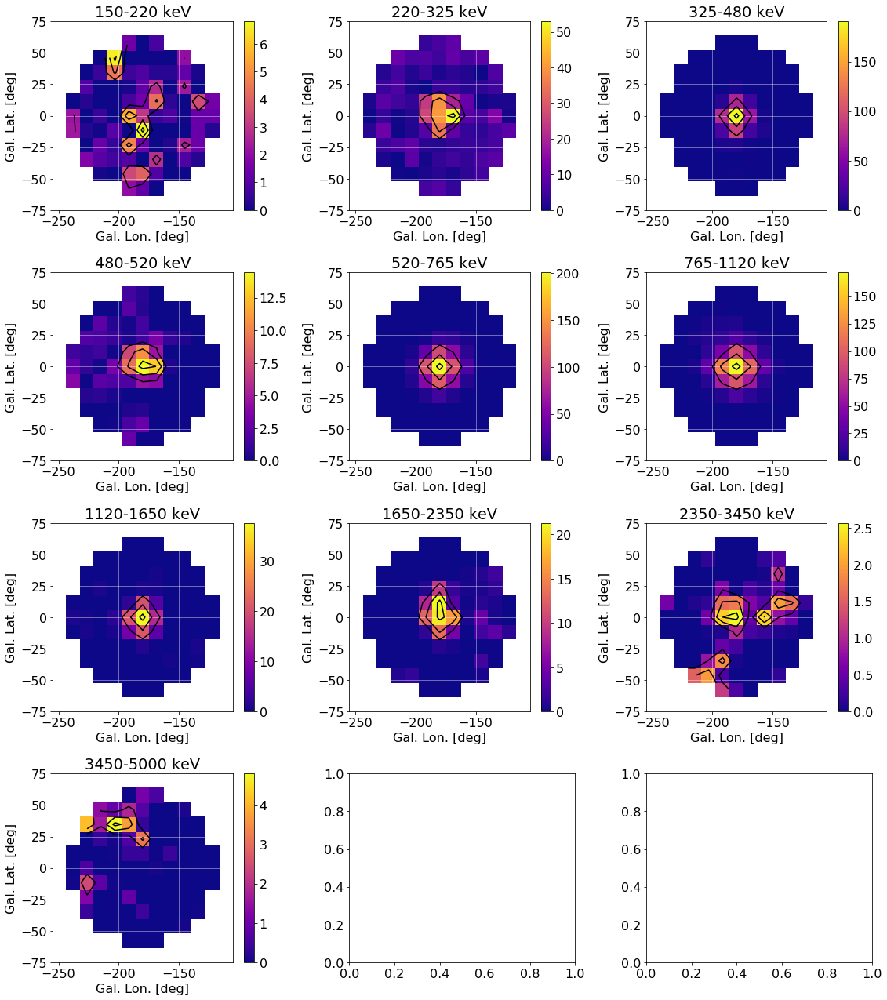

In [44]:
pc = result1.plot_TS_map_results()

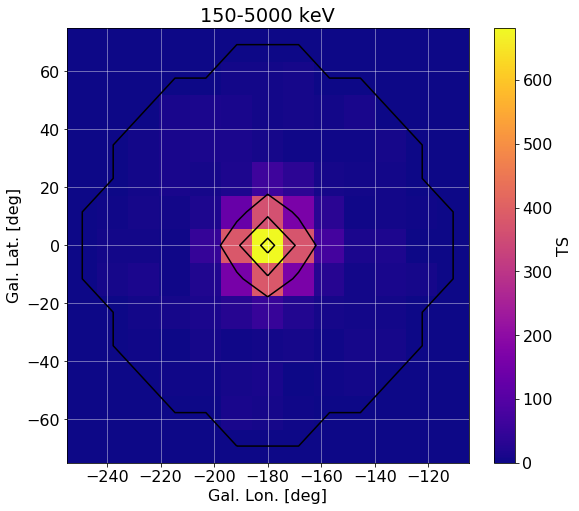

In [45]:
result1.plot_TS_map_results(mode='sum')

In [84]:
result2.TS_map([L_GRID,B_GRID],scipy=True)

Fitting background only...


Now fitting object at (l,b) = (-249.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-249.2,-69.2)


Now fitting object at (l,b) = (-237.7,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-237.7,-69.2)


Now fitting object at (l,b) = (-226.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-226.2,-69.2)


Now fitting object at (l,b) = (-214.6,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-214.6,-69.2)


Now fitting object at (l,b) = (-203.1,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-203.1,-69.2)


Now fitting object at (l,b) = (-191.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-191.5,-69.2)


Now fitting object at (l,b) = (-180.0,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-180.0,-69.2)


Now fitting object at (l,b) = (-168.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-168.5,-69.2)


Now fitting object at (l,b) = (-156.9,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-156.9,-69.2)


Now fitting object at (l,b) = (-145.4,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-145.4,-69.2)


Now fitting object at (l,b) = (-133.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-133.8,-69.2)


Now fitting object at (l,b) = (-122.3,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-122.3,-69.2)


Now fitting object at (l,b) = (-110.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-110.8,-69.2)


Now fitting object at (l,b) = (110.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-57.7)


Now fitting object at (l,b) = (122.3,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-57.7)


Now fitting object at (l,b) = (133.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-57.7)


Now fitting object at (l,b) = (145.4,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-57.7)


Now fitting object at (l,b) = (156.9,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-57.7)


Now fitting object at (l,b) = (168.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-57.7)


Now fitting object at (l,b) = (180.0,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-57.7)


Now fitting object at (l,b) = (191.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-57.7)


Now fitting object at (l,b) = (203.1,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-57.7)


Now fitting object at (l,b) = (214.6,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-57.7)


Now fitting object at (l,b) = (226.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-57.7)


Now fitting object at (l,b) = (237.7,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-57.7)


Now fitting object at (l,b) = (249.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-57.7)


Now fitting object at (l,b) = (110.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-46.2)


Now fitting object at (l,b) = (122.3,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-46.2)


Now fitting object at (l,b) = (133.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-46.2)


Now fitting object at (l,b) = (145.4,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-46.2)


Now fitting object at (l,b) = (156.9,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-46.2)


Now fitting object at (l,b) = (168.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-46.2)


Now fitting object at (l,b) = (180.0,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-46.2)


Now fitting object at (l,b) = (191.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-46.2)


Now fitting object at (l,b) = (203.1,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-46.2)


Now fitting object at (l,b) = (214.6,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-46.2)


Now fitting object at (l,b) = (226.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-46.2)


Now fitting object at (l,b) = (237.7,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-46.2)


Now fitting object at (l,b) = (249.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-46.2)


Now fitting object at (l,b) = (110.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-34.6)


Now fitting object at (l,b) = (122.3,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-34.6)


Now fitting object at (l,b) = (133.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-34.6)


Now fitting object at (l,b) = (145.4,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-34.6)


Now fitting object at (l,b) = (156.9,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-34.6)


Now fitting object at (l,b) = (168.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-34.6)


Now fitting object at (l,b) = (180.0,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-34.6)


Now fitting object at (l,b) = (191.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-34.6)


Now fitting object at (l,b) = (203.1,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-34.6)


Now fitting object at (l,b) = (214.6,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-34.6)


Now fitting object at (l,b) = (226.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-34.6)


Now fitting object at (l,b) = (237.7,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-34.6)


Now fitting object at (l,b) = (249.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-34.6)


Now fitting object at (l,b) = (110.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-23.1)


Now fitting object at (l,b) = (122.3,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-23.1)


Now fitting object at (l,b) = (133.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-23.1)


Now fitting object at (l,b) = (145.4,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-23.1)


Now fitting object at (l,b) = (156.9,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-23.1)


Now fitting object at (l,b) = (168.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-23.1)


Now fitting object at (l,b) = (180.0,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-23.1)


Now fitting object at (l,b) = (191.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-23.1)


Now fitting object at (l,b) = (203.1,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-23.1)


Now fitting object at (l,b) = (214.6,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-23.1)


Now fitting object at (l,b) = (226.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-23.1)


Now fitting object at (l,b) = (237.7,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-23.1)


Now fitting object at (l,b) = (249.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-23.1)


Now fitting object at (l,b) = (110.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-11.5)


Now fitting object at (l,b) = (122.3,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-11.5)


Now fitting object at (l,b) = (133.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-11.5)


Now fitting object at (l,b) = (145.4,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-11.5)


Now fitting object at (l,b) = (156.9,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-11.5)


Now fitting object at (l,b) = (168.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-11.5)


Now fitting object at (l,b) = (180.0,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-11.5)


Now fitting object at (l,b) = (191.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-11.5)


Now fitting object at (l,b) = (203.1,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-11.5)


Now fitting object at (l,b) = (214.6,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-11.5)


Now fitting object at (l,b) = (226.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-11.5)


Now fitting object at (l,b) = (237.7,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-11.5)


Now fitting object at (l,b) = (249.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-11.5)


Now fitting object at (l,b) = (110.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-0.0)


Now fitting object at (l,b) = (122.3,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-0.0)


Now fitting object at (l,b) = (133.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-0.0)


Now fitting object at (l,b) = (145.4,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-0.0)


Now fitting object at (l,b) = (156.9,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-0.0)


Now fitting object at (l,b) = (168.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-0.0)


Now fitting object at (l,b) = (180.0,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-0.0)


Now fitting object at (l,b) = (191.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-0.0)


Now fitting object at (l,b) = (203.1,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-0.0)


Now fitting object at (l,b) = (214.6,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-0.0)


Now fitting object at (l,b) = (226.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-0.0)


Now fitting object at (l,b) = (237.7,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-0.0)


Now fitting object at (l,b) = (249.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-0.0)


Now fitting object at (l,b) = (110.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,11.5)


Now fitting object at (l,b) = (122.3,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,11.5)


Now fitting object at (l,b) = (133.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,11.5)


Now fitting object at (l,b) = (145.4,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,11.5)


Now fitting object at (l,b) = (156.9,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,11.5)


Now fitting object at (l,b) = (168.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,11.5)


Now fitting object at (l,b) = (180.0,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,11.5)


Now fitting object at (l,b) = (191.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,11.5)


Now fitting object at (l,b) = (203.1,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,11.5)


Now fitting object at (l,b) = (214.6,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,11.5)


Now fitting object at (l,b) = (226.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,11.5)


Now fitting object at (l,b) = (237.7,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,11.5)


Now fitting object at (l,b) = (249.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,11.5)


Now fitting object at (l,b) = (110.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,23.1)


Now fitting object at (l,b) = (122.3,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,23.1)


Now fitting object at (l,b) = (133.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,23.1)


Now fitting object at (l,b) = (145.4,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,23.1)


Now fitting object at (l,b) = (156.9,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,23.1)


Now fitting object at (l,b) = (168.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,23.1)


Now fitting object at (l,b) = (180.0,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,23.1)


Now fitting object at (l,b) = (191.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,23.1)


Now fitting object at (l,b) = (203.1,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,23.1)


Now fitting object at (l,b) = (214.6,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,23.1)


Now fitting object at (l,b) = (226.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,23.1)


Now fitting object at (l,b) = (237.7,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,23.1)


Now fitting object at (l,b) = (249.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,23.1)


Now fitting object at (l,b) = (110.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,34.6)


Now fitting object at (l,b) = (122.3,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,34.6)


Now fitting object at (l,b) = (133.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,34.6)


Now fitting object at (l,b) = (145.4,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,34.6)


Now fitting object at (l,b) = (156.9,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,34.6)


Now fitting object at (l,b) = (168.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,34.6)


Now fitting object at (l,b) = (180.0,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,34.6)


Now fitting object at (l,b) = (191.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,34.6)


Now fitting object at (l,b) = (203.1,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,34.6)


Now fitting object at (l,b) = (214.6,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,34.6)


Now fitting object at (l,b) = (226.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,34.6)


Now fitting object at (l,b) = (237.7,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,34.6)


Now fitting object at (l,b) = (249.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,34.6)


Now fitting object at (l,b) = (110.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,46.2)


Now fitting object at (l,b) = (122.3,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,46.2)


Now fitting object at (l,b) = (133.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,46.2)


Now fitting object at (l,b) = (145.4,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,46.2)


Now fitting object at (l,b) = (156.9,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,46.2)


Now fitting object at (l,b) = (168.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,46.2)


Now fitting object at (l,b) = (180.0,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,46.2)


Now fitting object at (l,b) = (191.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,46.2)


Now fitting object at (l,b) = (203.1,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,46.2)


Now fitting object at (l,b) = (214.6,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,46.2)


Now fitting object at (l,b) = (226.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,46.2)


Now fitting object at (l,b) = (237.7,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,46.2)


Now fitting object at (l,b) = (249.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,46.2)


Now fitting object at (l,b) = (110.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,57.7)


Now fitting object at (l,b) = (122.3,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,57.7)


Now fitting object at (l,b) = (133.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,57.7)


Now fitting object at (l,b) = (145.4,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,57.7)


Now fitting object at (l,b) = (156.9,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,57.7)


Now fitting object at (l,b) = (168.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,57.7)


Now fitting object at (l,b) = (180.0,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,57.7)


Now fitting object at (l,b) = (191.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,57.7)


Now fitting object at (l,b) = (203.1,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,57.7)


Now fitting object at (l,b) = (214.6,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,57.7)


Now fitting object at (l,b) = (226.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,57.7)


Now fitting object at (l,b) = (237.7,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,57.7)


Now fitting object at (l,b) = (249.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,57.7)


Now fitting object at (l,b) = (110.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,69.2)


Now fitting object at (l,b) = (122.3,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,69.2)


Now fitting object at (l,b) = (133.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,69.2)


Now fitting object at (l,b) = (145.4,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,69.2)


Now fitting object at (l,b) = (156.9,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,69.2)


Now fitting object at (l,b) = (168.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,69.2)


Now fitting object at (l,b) = (180.0,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,69.2)


Now fitting object at (l,b) = (191.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,69.2)


Now fitting object at (l,b) = (203.1,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,69.2)


Now fitting object at (l,b) = (214.6,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,69.2)


Now fitting object at (l,b) = (226.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,69.2)


Now fitting object at (l,b) = (237.7,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,69.2)


Now fitting object at (l,b) = (249.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,69.2)


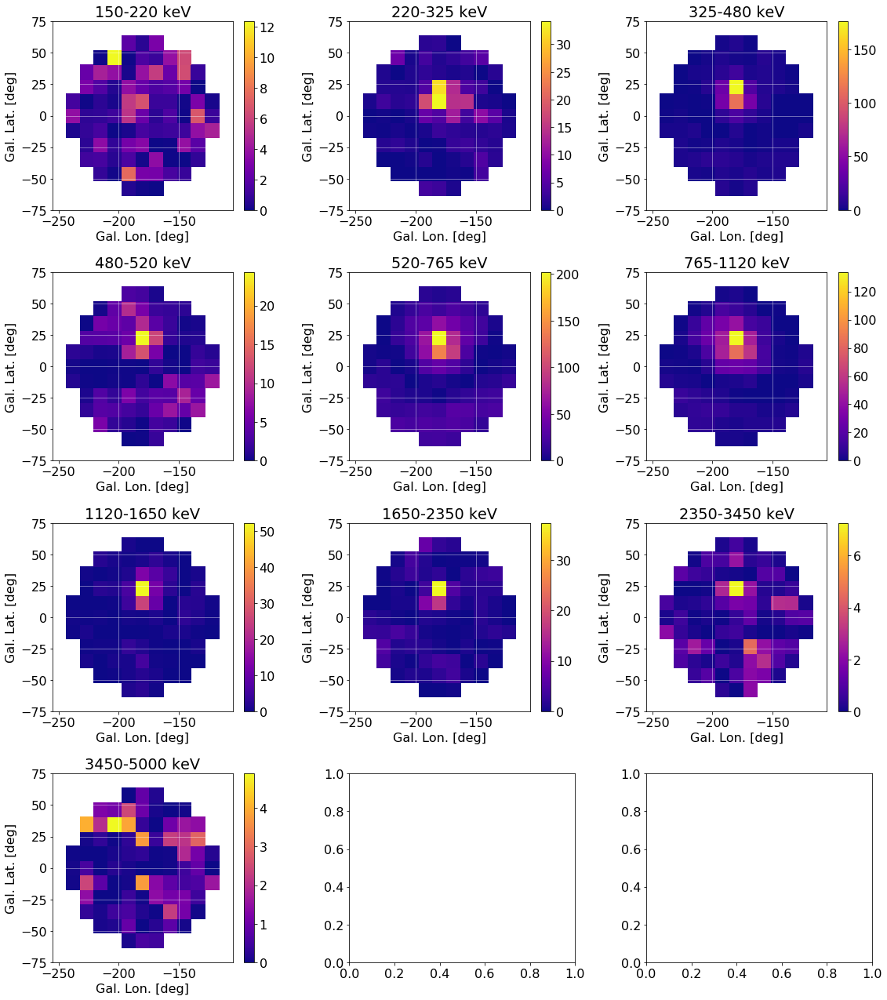

In [85]:
pc = result2.plot_TS_map_results()

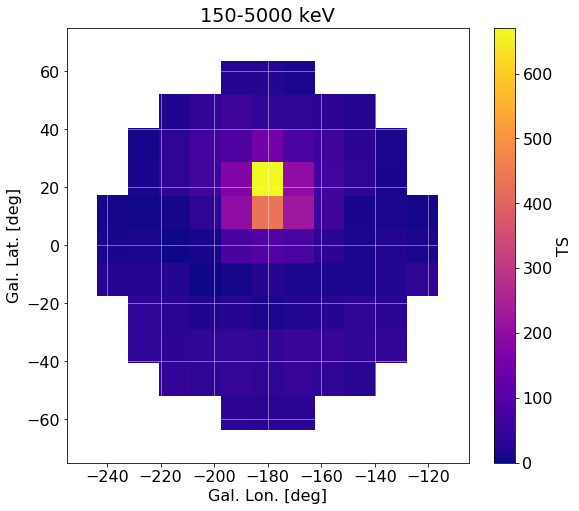

In [86]:
result2.plot_TS_map_results(mode='sum')

In [87]:
result3.TS_map([L_GRID,B_GRID],scipy=False)

Fitting background only...


Now fitting object at (l,b) = (-249.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-249.2,-69.2)


Something went wrong with the fit, ignoring grid point  -249.23076923076923 -69.23076923076923
Now fitting object at (l,b) = (-237.7,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-237.7,-69.2)


Something went wrong with the fit, ignoring grid point  -237.6923076923077 -69.23076923076923
Now fitting object at (l,b) = (-226.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-226.2,-69.2)


Something went wrong with the fit, ignoring grid point  -226.15384615384616 -69.23076923076923
Now fitting object at (l,b) = (-214.6,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-214.6,-69.2)


Something went wrong with the fit, ignoring grid point  -214.6153846153846 -69.23076923076923
Now fitting object at (l,b) = (-203.1,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-203.1,-69.2)


Something went wrong with the fit, ignoring grid point  -203.07692307692307 -69.23076923076923
Now fitting object at (l,b) = (-191.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-191.5,-69.2)


Something went wrong with the fit, ignoring grid point  -191.53846153846155 -69.23076923076923
Now fitting object at (l,b) = (-180.0,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-180.0,-69.2)


Something went wrong with the fit, ignoring grid point  -180.0 -69.23076923076923
Now fitting object at (l,b) = (-168.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-168.5,-69.2)


Something went wrong with the fit, ignoring grid point  -168.46153846153845 -69.23076923076923
Now fitting object at (l,b) = (-156.9,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-156.9,-69.2)


Something went wrong with the fit, ignoring grid point  -156.9230769230769 -69.23076923076923
Now fitting object at (l,b) = (-145.4,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-145.4,-69.2)


Something went wrong with the fit, ignoring grid point  -145.3846153846154 -69.23076923076923
Now fitting object at (l,b) = (-133.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-133.8,-69.2)


Something went wrong with the fit, ignoring grid point  -133.84615384615384 -69.23076923076923
Now fitting object at (l,b) = (-122.3,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-122.3,-69.2)


Something went wrong with the fit, ignoring grid point  -122.30769230769232 -69.23076923076923
Now fitting object at (l,b) = (-110.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-110.8,-69.2)


Something went wrong with the fit, ignoring grid point  -110.76923076923077 -69.23076923076923
Now fitting object at (l,b) = (110.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-57.7)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -57.69230769230769
Now fitting object at (l,b) = (122.3,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-57.7)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -57.69230769230769
Now fitting object at (l,b) = (133.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-57.7)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -57.69230769230769
Now fitting object at (l,b) = (145.4,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-57.7)


Something went wrong with the fit, ignoring grid point  145.3846153846154 -57.69230769230769
Now fitting object at (l,b) = (156.9,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-57.7)


Something went wrong with the fit, ignoring grid point  156.92307692307693 -57.69230769230769
Now fitting object at (l,b) = (168.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-57.7)


Now fitting object at (l,b) = (180.0,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-57.7)


Now fitting object at (l,b) = (191.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-57.7)


Now fitting object at (l,b) = (203.1,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-57.7)


Something went wrong with the fit, ignoring grid point  203.0769230769231 -57.69230769230769
Now fitting object at (l,b) = (214.6,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-57.7)


Something went wrong with the fit, ignoring grid point  214.6153846153846 -57.69230769230769
Now fitting object at (l,b) = (226.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-57.7)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -57.69230769230769
Now fitting object at (l,b) = (237.7,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-57.7)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -57.69230769230769
Now fitting object at (l,b) = (249.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-57.7)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -57.69230769230769
Now fitting object at (l,b) = (110.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-46.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -46.153846153846146
Now fitting object at (l,b) = (122.3,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-46.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -46.153846153846146
Now fitting object at (l,b) = (133.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-46.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -46.153846153846146
Now fitting object at (l,b) = (145.4,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-46.2)


Now fitting object at (l,b) = (156.9,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-46.2)


Now fitting object at (l,b) = (168.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-46.2)


Now fitting object at (l,b) = (180.0,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-46.2)


Now fitting object at (l,b) = (191.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-46.2)


Now fitting object at (l,b) = (203.1,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-46.2)


Now fitting object at (l,b) = (214.6,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-46.2)


Now fitting object at (l,b) = (226.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-46.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -46.153846153846146
Now fitting object at (l,b) = (237.7,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-46.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -46.153846153846146
Now fitting object at (l,b) = (249.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-46.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -46.153846153846146
Now fitting object at (l,b) = (110.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-34.6)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -34.61538461538461
Now fitting object at (l,b) = (122.3,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-34.6)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -34.61538461538461
Now fitting object at (l,b) = (133.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-34.6)


Now fitting object at (l,b) = (145.4,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-34.6)


Now fitting object at (l,b) = (156.9,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-34.6)


Now fitting object at (l,b) = (168.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-34.6)


Now fitting object at (l,b) = (180.0,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-34.6)


Now fitting object at (l,b) = (191.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-34.6)


Now fitting object at (l,b) = (203.1,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-34.6)


Now fitting object at (l,b) = (214.6,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-34.6)


Now fitting object at (l,b) = (226.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-34.6)


Now fitting object at (l,b) = (237.7,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-34.6)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -34.61538461538461
Now fitting object at (l,b) = (249.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-34.6)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -34.61538461538461
Now fitting object at (l,b) = (110.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-23.1)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -23.076923076923077
Now fitting object at (l,b) = (122.3,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-23.1)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -23.076923076923077
Now fitting object at (l,b) = (133.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-23.1)


Now fitting object at (l,b) = (145.4,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-23.1)


Now fitting object at (l,b) = (156.9,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-23.1)


Now fitting object at (l,b) = (168.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-23.1)


Now fitting object at (l,b) = (180.0,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-23.1)


Now fitting object at (l,b) = (191.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-23.1)


Now fitting object at (l,b) = (203.1,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-23.1)


Now fitting object at (l,b) = (214.6,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-23.1)


Now fitting object at (l,b) = (226.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-23.1)


Now fitting object at (l,b) = (237.7,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-23.1)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -23.076923076923077
Now fitting object at (l,b) = (249.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-23.1)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -23.076923076923077
Now fitting object at (l,b) = (110.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-11.5)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -11.538461538461537
Now fitting object at (l,b) = (122.3,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-11.5)


Now fitting object at (l,b) = (133.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-11.5)


Now fitting object at (l,b) = (145.4,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-11.5)


Now fitting object at (l,b) = (156.9,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-11.5)


Now fitting object at (l,b) = (168.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-11.5)


Now fitting object at (l,b) = (180.0,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-11.5)


Now fitting object at (l,b) = (191.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-11.5)


Now fitting object at (l,b) = (203.1,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-11.5)


Now fitting object at (l,b) = (214.6,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-11.5)


Now fitting object at (l,b) = (226.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-11.5)


Now fitting object at (l,b) = (237.7,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-11.5)


Now fitting object at (l,b) = (249.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-11.5)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -11.538461538461537
Now fitting object at (l,b) = (110.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-0.0)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -3.552713678800501e-15
Now fitting object at (l,b) = (122.3,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-0.0)


Now fitting object at (l,b) = (133.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-0.0)


Now fitting object at (l,b) = (145.4,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-0.0)


Now fitting object at (l,b) = (156.9,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-0.0)


Now fitting object at (l,b) = (168.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-0.0)


Now fitting object at (l,b) = (180.0,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-0.0)


Now fitting object at (l,b) = (191.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-0.0)


Now fitting object at (l,b) = (203.1,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-0.0)


Now fitting object at (l,b) = (214.6,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-0.0)


Now fitting object at (l,b) = (226.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-0.0)


Now fitting object at (l,b) = (237.7,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-0.0)


Now fitting object at (l,b) = (249.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-0.0)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -3.552713678800501e-15
Now fitting object at (l,b) = (110.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,11.5)


Something went wrong with the fit, ignoring grid point  110.76923076923077 11.538461538461544
Now fitting object at (l,b) = (122.3,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,11.5)


Now fitting object at (l,b) = (133.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,11.5)


Now fitting object at (l,b) = (145.4,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,11.5)


Now fitting object at (l,b) = (156.9,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,11.5)


Now fitting object at (l,b) = (168.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,11.5)


Now fitting object at (l,b) = (180.0,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,11.5)


Now fitting object at (l,b) = (191.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,11.5)


Now fitting object at (l,b) = (203.1,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,11.5)


Now fitting object at (l,b) = (214.6,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,11.5)


Now fitting object at (l,b) = (226.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,11.5)


Now fitting object at (l,b) = (237.7,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,11.5)


Now fitting object at (l,b) = (249.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,11.5)


Something went wrong with the fit, ignoring grid point  249.23076923076923 11.538461538461544
Now fitting object at (l,b) = (110.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,23.1)


Something went wrong with the fit, ignoring grid point  110.76923076923077 23.076923076923077
Now fitting object at (l,b) = (122.3,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,23.1)


Something went wrong with the fit, ignoring grid point  122.30769230769229 23.076923076923077
Now fitting object at (l,b) = (133.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,23.1)


Now fitting object at (l,b) = (145.4,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,23.1)


Now fitting object at (l,b) = (156.9,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,23.1)


Now fitting object at (l,b) = (168.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,23.1)


Now fitting object at (l,b) = (180.0,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,23.1)


Now fitting object at (l,b) = (191.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,23.1)


Now fitting object at (l,b) = (203.1,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,23.1)


Now fitting object at (l,b) = (214.6,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,23.1)


Now fitting object at (l,b) = (226.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,23.1)


Now fitting object at (l,b) = (237.7,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,23.1)


Something went wrong with the fit, ignoring grid point  237.69230769230768 23.076923076923077
Now fitting object at (l,b) = (249.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,23.1)


Something went wrong with the fit, ignoring grid point  249.23076923076923 23.076923076923077
Now fitting object at (l,b) = (110.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,34.6)


Something went wrong with the fit, ignoring grid point  110.76923076923077 34.61538461538461
Now fitting object at (l,b) = (122.3,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,34.6)


Something went wrong with the fit, ignoring grid point  122.30769230769229 34.61538461538461
Now fitting object at (l,b) = (133.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,34.6)


Now fitting object at (l,b) = (145.4,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,34.6)


Now fitting object at (l,b) = (156.9,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,34.6)


Now fitting object at (l,b) = (168.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,34.6)


Now fitting object at (l,b) = (180.0,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,34.6)


Now fitting object at (l,b) = (191.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,34.6)


Now fitting object at (l,b) = (203.1,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,34.6)


Now fitting object at (l,b) = (214.6,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,34.6)


Now fitting object at (l,b) = (226.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,34.6)


Now fitting object at (l,b) = (237.7,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,34.6)


Something went wrong with the fit, ignoring grid point  237.69230769230768 34.61538461538461
Now fitting object at (l,b) = (249.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,34.6)


Something went wrong with the fit, ignoring grid point  249.23076923076923 34.61538461538461
Now fitting object at (l,b) = (110.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,46.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 46.15384615384616
Now fitting object at (l,b) = (122.3,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,46.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 46.15384615384616
Now fitting object at (l,b) = (133.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,46.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 46.15384615384616
Now fitting object at (l,b) = (145.4,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,46.2)


Now fitting object at (l,b) = (156.9,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,46.2)


Now fitting object at (l,b) = (168.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,46.2)


Now fitting object at (l,b) = (180.0,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,46.2)


Now fitting object at (l,b) = (191.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,46.2)


Now fitting object at (l,b) = (203.1,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,46.2)


Now fitting object at (l,b) = (214.6,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,46.2)


Now fitting object at (l,b) = (226.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,46.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 46.15384615384616
Now fitting object at (l,b) = (237.7,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,46.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 46.15384615384616
Now fitting object at (l,b) = (249.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,46.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 46.15384615384616
Now fitting object at (l,b) = (110.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,57.7)


Something went wrong with the fit, ignoring grid point  110.76923076923077 57.69230769230769
Now fitting object at (l,b) = (122.3,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,57.7)


Something went wrong with the fit, ignoring grid point  122.30769230769229 57.69230769230769
Now fitting object at (l,b) = (133.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,57.7)


Something went wrong with the fit, ignoring grid point  133.84615384615384 57.69230769230769
Now fitting object at (l,b) = (145.4,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,57.7)


Something went wrong with the fit, ignoring grid point  145.3846153846154 57.69230769230769
Now fitting object at (l,b) = (156.9,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,57.7)


Something went wrong with the fit, ignoring grid point  156.92307692307693 57.69230769230769
Now fitting object at (l,b) = (168.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,57.7)


Now fitting object at (l,b) = (180.0,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,57.7)


Now fitting object at (l,b) = (191.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,57.7)


Now fitting object at (l,b) = (203.1,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,57.7)


Something went wrong with the fit, ignoring grid point  203.0769230769231 57.69230769230769
Now fitting object at (l,b) = (214.6,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,57.7)


Something went wrong with the fit, ignoring grid point  214.6153846153846 57.69230769230769
Now fitting object at (l,b) = (226.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,57.7)


Something went wrong with the fit, ignoring grid point  226.15384615384616 57.69230769230769
Now fitting object at (l,b) = (237.7,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,57.7)


Something went wrong with the fit, ignoring grid point  237.69230769230768 57.69230769230769
Now fitting object at (l,b) = (249.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,57.7)


Something went wrong with the fit, ignoring grid point  249.23076923076923 57.69230769230769
Now fitting object at (l,b) = (110.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,69.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 69.23076923076923
Now fitting object at (l,b) = (122.3,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,69.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 69.23076923076923
Now fitting object at (l,b) = (133.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,69.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 69.23076923076923
Now fitting object at (l,b) = (145.4,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,69.2)


Something went wrong with the fit, ignoring grid point  145.3846153846154 69.23076923076923
Now fitting object at (l,b) = (156.9,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,69.2)


Something went wrong with the fit, ignoring grid point  156.92307692307693 69.23076923076923
Now fitting object at (l,b) = (168.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,69.2)


Something went wrong with the fit, ignoring grid point  168.46153846153845 69.23076923076923
Now fitting object at (l,b) = (180.0,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,69.2)


Something went wrong with the fit, ignoring grid point  180.0 69.23076923076923
Now fitting object at (l,b) = (191.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,69.2)


Something went wrong with the fit, ignoring grid point  191.53846153846155 69.23076923076923
Now fitting object at (l,b) = (203.1,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,69.2)


Something went wrong with the fit, ignoring grid point  203.0769230769231 69.23076923076923
Now fitting object at (l,b) = (214.6,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,69.2)


Something went wrong with the fit, ignoring grid point  214.6153846153846 69.23076923076923
Now fitting object at (l,b) = (226.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,69.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 69.23076923076923
Now fitting object at (l,b) = (237.7,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,69.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 69.23076923076923
Now fitting object at (l,b) = (249.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,69.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 69.23076923076923
Initial log joint probability = 3294.12
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       3294.26     0.0103235   0.000287272   0.0003712       0.001        3   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = 25191.1
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       25191.8    0.00996298      0.179025   7.038e-05       0.001        3   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = 51239.2
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       51240.5    0.00999759       1.25292   3.771e-05       0.001        3   
Optimization terminated normally: 
  C

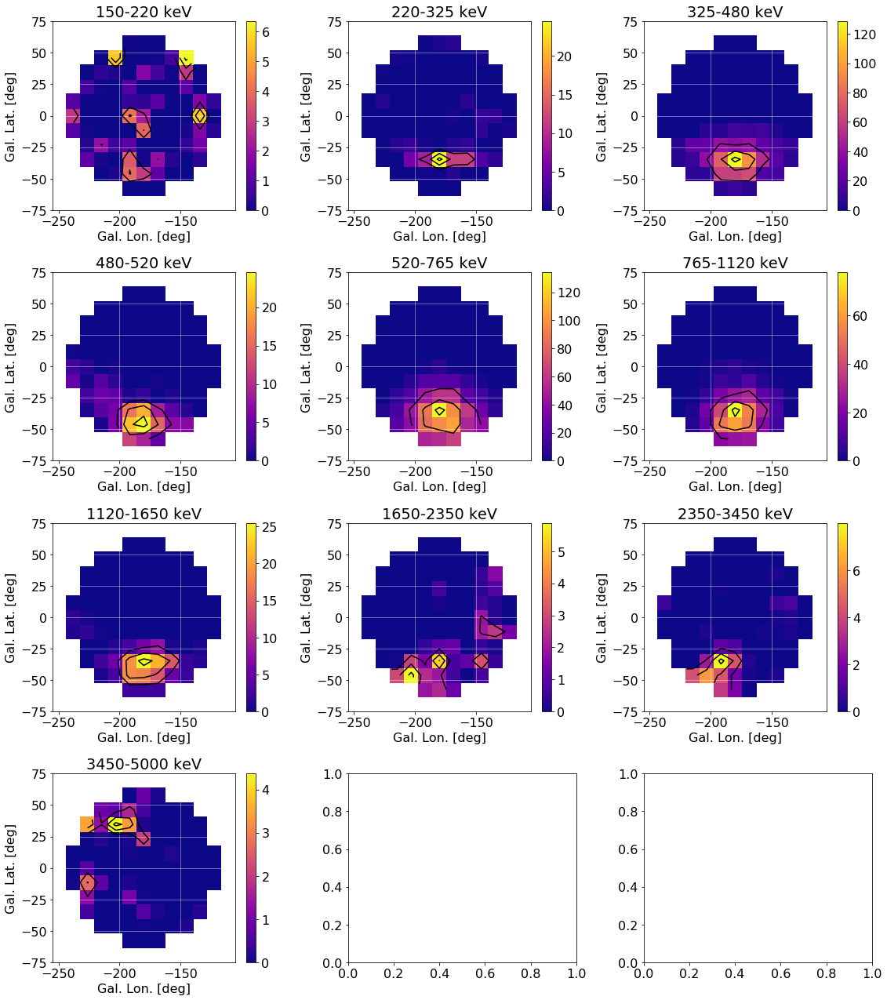

In [88]:
pc = result3.plot_TS_map_results()

In [89]:
result4.TS_map([L_GRID,B_GRID],scipy=False)

Fitting background only...


Now fitting object at (l,b) = (-249.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-249.2,-69.2)


Something went wrong with the fit, ignoring grid point  -249.23076923076923 -69.23076923076923
Now fitting object at (l,b) = (-237.7,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-237.7,-69.2)


Something went wrong with the fit, ignoring grid point  -237.6923076923077 -69.23076923076923
Now fitting object at (l,b) = (-226.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-226.2,-69.2)


Something went wrong with the fit, ignoring grid point  -226.15384615384616 -69.23076923076923
Now fitting object at (l,b) = (-214.6,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-214.6,-69.2)


Something went wrong with the fit, ignoring grid point  -214.6153846153846 -69.23076923076923
Now fitting object at (l,b) = (-203.1,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-203.1,-69.2)


Something went wrong with the fit, ignoring grid point  -203.07692307692307 -69.23076923076923
Now fitting object at (l,b) = (-191.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-191.5,-69.2)


Something went wrong with the fit, ignoring grid point  -191.53846153846155 -69.23076923076923
Now fitting object at (l,b) = (-180.0,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-180.0,-69.2)


Something went wrong with the fit, ignoring grid point  -180.0 -69.23076923076923
Now fitting object at (l,b) = (-168.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-168.5,-69.2)


Something went wrong with the fit, ignoring grid point  -168.46153846153845 -69.23076923076923
Now fitting object at (l,b) = (-156.9,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-156.9,-69.2)


Something went wrong with the fit, ignoring grid point  -156.9230769230769 -69.23076923076923
Now fitting object at (l,b) = (-145.4,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-145.4,-69.2)


Something went wrong with the fit, ignoring grid point  -145.3846153846154 -69.23076923076923
Now fitting object at (l,b) = (-133.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-133.8,-69.2)


Something went wrong with the fit, ignoring grid point  -133.84615384615384 -69.23076923076923
Now fitting object at (l,b) = (-122.3,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-122.3,-69.2)


Something went wrong with the fit, ignoring grid point  -122.30769230769232 -69.23076923076923
Now fitting object at (l,b) = (-110.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-110.8,-69.2)


Something went wrong with the fit, ignoring grid point  -110.76923076923077 -69.23076923076923
Now fitting object at (l,b) = (110.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-57.7)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -57.69230769230769
Now fitting object at (l,b) = (122.3,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-57.7)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -57.69230769230769
Now fitting object at (l,b) = (133.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-57.7)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -57.69230769230769
Now fitting object at (l,b) = (145.4,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-57.7)


Something went wrong with the fit, ignoring grid point  145.3846153846154 -57.69230769230769
Now fitting object at (l,b) = (156.9,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-57.7)


Something went wrong with the fit, ignoring grid point  156.92307692307693 -57.69230769230769
Now fitting object at (l,b) = (168.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-57.7)


Now fitting object at (l,b) = (180.0,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-57.7)


Now fitting object at (l,b) = (191.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-57.7)


Now fitting object at (l,b) = (203.1,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-57.7)


Something went wrong with the fit, ignoring grid point  203.0769230769231 -57.69230769230769
Now fitting object at (l,b) = (214.6,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-57.7)


Something went wrong with the fit, ignoring grid point  214.6153846153846 -57.69230769230769
Now fitting object at (l,b) = (226.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-57.7)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -57.69230769230769
Now fitting object at (l,b) = (237.7,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-57.7)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -57.69230769230769
Now fitting object at (l,b) = (249.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-57.7)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -57.69230769230769
Now fitting object at (l,b) = (110.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-46.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -46.153846153846146
Now fitting object at (l,b) = (122.3,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-46.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -46.153846153846146
Now fitting object at (l,b) = (133.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-46.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -46.153846153846146
Now fitting object at (l,b) = (145.4,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-46.2)


Now fitting object at (l,b) = (156.9,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-46.2)


Now fitting object at (l,b) = (168.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-46.2)


Now fitting object at (l,b) = (180.0,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-46.2)


Now fitting object at (l,b) = (191.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-46.2)


Now fitting object at (l,b) = (203.1,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-46.2)


Now fitting object at (l,b) = (214.6,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-46.2)


Now fitting object at (l,b) = (226.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-46.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -46.153846153846146
Now fitting object at (l,b) = (237.7,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-46.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -46.153846153846146
Now fitting object at (l,b) = (249.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-46.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -46.153846153846146
Now fitting object at (l,b) = (110.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-34.6)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -34.61538461538461
Now fitting object at (l,b) = (122.3,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-34.6)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -34.61538461538461
Now fitting object at (l,b) = (133.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-34.6)


Now fitting object at (l,b) = (145.4,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-34.6)


Now fitting object at (l,b) = (156.9,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-34.6)


Now fitting object at (l,b) = (168.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-34.6)


Now fitting object at (l,b) = (180.0,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-34.6)


Now fitting object at (l,b) = (191.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-34.6)


Now fitting object at (l,b) = (203.1,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-34.6)


Now fitting object at (l,b) = (214.6,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-34.6)


Now fitting object at (l,b) = (226.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-34.6)


Now fitting object at (l,b) = (237.7,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-34.6)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -34.61538461538461
Now fitting object at (l,b) = (249.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-34.6)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -34.61538461538461
Now fitting object at (l,b) = (110.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-23.1)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -23.076923076923077
Now fitting object at (l,b) = (122.3,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-23.1)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -23.076923076923077
Now fitting object at (l,b) = (133.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-23.1)


Now fitting object at (l,b) = (145.4,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-23.1)


Now fitting object at (l,b) = (156.9,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-23.1)


Now fitting object at (l,b) = (168.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-23.1)


Now fitting object at (l,b) = (180.0,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-23.1)


Now fitting object at (l,b) = (191.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-23.1)


Now fitting object at (l,b) = (203.1,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-23.1)


Now fitting object at (l,b) = (214.6,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-23.1)


Now fitting object at (l,b) = (226.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-23.1)


Now fitting object at (l,b) = (237.7,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-23.1)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -23.076923076923077
Now fitting object at (l,b) = (249.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-23.1)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -23.076923076923077
Now fitting object at (l,b) = (110.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-11.5)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -11.538461538461537
Now fitting object at (l,b) = (122.3,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-11.5)


Now fitting object at (l,b) = (133.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-11.5)


Now fitting object at (l,b) = (145.4,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-11.5)


Now fitting object at (l,b) = (156.9,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-11.5)


Now fitting object at (l,b) = (168.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-11.5)


Now fitting object at (l,b) = (180.0,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-11.5)


Now fitting object at (l,b) = (191.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-11.5)


Now fitting object at (l,b) = (203.1,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-11.5)


Now fitting object at (l,b) = (214.6,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-11.5)


Now fitting object at (l,b) = (226.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-11.5)


Now fitting object at (l,b) = (237.7,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-11.5)


Now fitting object at (l,b) = (249.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-11.5)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -11.538461538461537
Now fitting object at (l,b) = (110.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-0.0)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -3.552713678800501e-15
Now fitting object at (l,b) = (122.3,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-0.0)


Now fitting object at (l,b) = (133.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-0.0)


Now fitting object at (l,b) = (145.4,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-0.0)


Now fitting object at (l,b) = (156.9,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-0.0)


Now fitting object at (l,b) = (168.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-0.0)


Now fitting object at (l,b) = (180.0,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-0.0)


Now fitting object at (l,b) = (191.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-0.0)


Now fitting object at (l,b) = (203.1,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-0.0)


Now fitting object at (l,b) = (214.6,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-0.0)


Now fitting object at (l,b) = (226.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-0.0)


Now fitting object at (l,b) = (237.7,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-0.0)


Now fitting object at (l,b) = (249.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-0.0)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -3.552713678800501e-15
Now fitting object at (l,b) = (110.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,11.5)


Something went wrong with the fit, ignoring grid point  110.76923076923077 11.538461538461544
Now fitting object at (l,b) = (122.3,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,11.5)


Now fitting object at (l,b) = (133.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,11.5)


Now fitting object at (l,b) = (145.4,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,11.5)


Now fitting object at (l,b) = (156.9,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,11.5)


Now fitting object at (l,b) = (168.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,11.5)


Now fitting object at (l,b) = (180.0,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,11.5)


Now fitting object at (l,b) = (191.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,11.5)


Now fitting object at (l,b) = (203.1,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,11.5)


Now fitting object at (l,b) = (214.6,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,11.5)


Now fitting object at (l,b) = (226.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,11.5)


Now fitting object at (l,b) = (237.7,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,11.5)


Now fitting object at (l,b) = (249.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,11.5)


Something went wrong with the fit, ignoring grid point  249.23076923076923 11.538461538461544
Now fitting object at (l,b) = (110.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,23.1)


Something went wrong with the fit, ignoring grid point  110.76923076923077 23.076923076923077
Now fitting object at (l,b) = (122.3,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,23.1)


Something went wrong with the fit, ignoring grid point  122.30769230769229 23.076923076923077
Now fitting object at (l,b) = (133.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,23.1)


Now fitting object at (l,b) = (145.4,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,23.1)


Now fitting object at (l,b) = (156.9,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,23.1)


Now fitting object at (l,b) = (168.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,23.1)


Now fitting object at (l,b) = (180.0,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,23.1)


Now fitting object at (l,b) = (191.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,23.1)


Now fitting object at (l,b) = (203.1,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,23.1)


Now fitting object at (l,b) = (214.6,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,23.1)


Now fitting object at (l,b) = (226.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,23.1)


Now fitting object at (l,b) = (237.7,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,23.1)


Something went wrong with the fit, ignoring grid point  237.69230769230768 23.076923076923077
Now fitting object at (l,b) = (249.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,23.1)


Something went wrong with the fit, ignoring grid point  249.23076923076923 23.076923076923077
Now fitting object at (l,b) = (110.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,34.6)


Something went wrong with the fit, ignoring grid point  110.76923076923077 34.61538461538461
Now fitting object at (l,b) = (122.3,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,34.6)


Something went wrong with the fit, ignoring grid point  122.30769230769229 34.61538461538461
Now fitting object at (l,b) = (133.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,34.6)


Now fitting object at (l,b) = (145.4,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,34.6)


Now fitting object at (l,b) = (156.9,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,34.6)


Now fitting object at (l,b) = (168.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,34.6)


Now fitting object at (l,b) = (180.0,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,34.6)


Now fitting object at (l,b) = (191.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,34.6)


Now fitting object at (l,b) = (203.1,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,34.6)


Now fitting object at (l,b) = (214.6,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,34.6)


Now fitting object at (l,b) = (226.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,34.6)


Now fitting object at (l,b) = (237.7,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,34.6)


Something went wrong with the fit, ignoring grid point  237.69230769230768 34.61538461538461
Now fitting object at (l,b) = (249.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,34.6)


Something went wrong with the fit, ignoring grid point  249.23076923076923 34.61538461538461
Now fitting object at (l,b) = (110.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,46.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 46.15384615384616
Now fitting object at (l,b) = (122.3,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,46.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 46.15384615384616
Now fitting object at (l,b) = (133.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,46.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 46.15384615384616
Now fitting object at (l,b) = (145.4,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,46.2)


Now fitting object at (l,b) = (156.9,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,46.2)


Now fitting object at (l,b) = (168.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,46.2)


Now fitting object at (l,b) = (180.0,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,46.2)


Now fitting object at (l,b) = (191.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,46.2)


Now fitting object at (l,b) = (203.1,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,46.2)


Now fitting object at (l,b) = (214.6,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,46.2)


Now fitting object at (l,b) = (226.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,46.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 46.15384615384616
Now fitting object at (l,b) = (237.7,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,46.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 46.15384615384616
Now fitting object at (l,b) = (249.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,46.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 46.15384615384616
Now fitting object at (l,b) = (110.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,57.7)


Something went wrong with the fit, ignoring grid point  110.76923076923077 57.69230769230769
Now fitting object at (l,b) = (122.3,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,57.7)


Something went wrong with the fit, ignoring grid point  122.30769230769229 57.69230769230769
Now fitting object at (l,b) = (133.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,57.7)


Something went wrong with the fit, ignoring grid point  133.84615384615384 57.69230769230769
Now fitting object at (l,b) = (145.4,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,57.7)


Something went wrong with the fit, ignoring grid point  145.3846153846154 57.69230769230769
Now fitting object at (l,b) = (156.9,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,57.7)


Something went wrong with the fit, ignoring grid point  156.92307692307693 57.69230769230769
Now fitting object at (l,b) = (168.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,57.7)


Now fitting object at (l,b) = (180.0,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,57.7)


Now fitting object at (l,b) = (191.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,57.7)


Now fitting object at (l,b) = (203.1,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,57.7)


Something went wrong with the fit, ignoring grid point  203.0769230769231 57.69230769230769
Now fitting object at (l,b) = (214.6,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,57.7)


Something went wrong with the fit, ignoring grid point  214.6153846153846 57.69230769230769
Now fitting object at (l,b) = (226.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,57.7)


Something went wrong with the fit, ignoring grid point  226.15384615384616 57.69230769230769
Now fitting object at (l,b) = (237.7,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,57.7)


Something went wrong with the fit, ignoring grid point  237.69230769230768 57.69230769230769
Now fitting object at (l,b) = (249.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,57.7)


Something went wrong with the fit, ignoring grid point  249.23076923076923 57.69230769230769
Now fitting object at (l,b) = (110.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,69.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 69.23076923076923
Now fitting object at (l,b) = (122.3,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,69.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 69.23076923076923
Now fitting object at (l,b) = (133.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,69.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 69.23076923076923
Now fitting object at (l,b) = (145.4,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,69.2)


Something went wrong with the fit, ignoring grid point  145.3846153846154 69.23076923076923
Now fitting object at (l,b) = (156.9,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,69.2)


Something went wrong with the fit, ignoring grid point  156.92307692307693 69.23076923076923
Now fitting object at (l,b) = (168.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,69.2)


Something went wrong with the fit, ignoring grid point  168.46153846153845 69.23076923076923
Now fitting object at (l,b) = (180.0,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,69.2)


Something went wrong with the fit, ignoring grid point  180.0 69.23076923076923
Now fitting object at (l,b) = (191.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,69.2)


Something went wrong with the fit, ignoring grid point  191.53846153846155 69.23076923076923
Now fitting object at (l,b) = (203.1,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,69.2)


Something went wrong with the fit, ignoring grid point  203.0769230769231 69.23076923076923
Now fitting object at (l,b) = (214.6,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,69.2)


Something went wrong with the fit, ignoring grid point  214.6153846153846 69.23076923076923
Now fitting object at (l,b) = (226.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,69.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 69.23076923076923
Now fitting object at (l,b) = (237.7,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,69.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 69.23076923076923
Now fitting object at (l,b) = (249.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,69.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 69.23076923076923
Initial log joint probability = 2564.94
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       2565.06    0.00995037   8.26172e-05   0.0004295       0.001        3   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = 21024.1
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       21024.8    0.00996011      0.123193   7.907e-05       0.001        3   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = 44200.9
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       44202.1    0.00998915      0.934481    4.15e-05       0.001        3   
Optimization terminated normally: 
  C

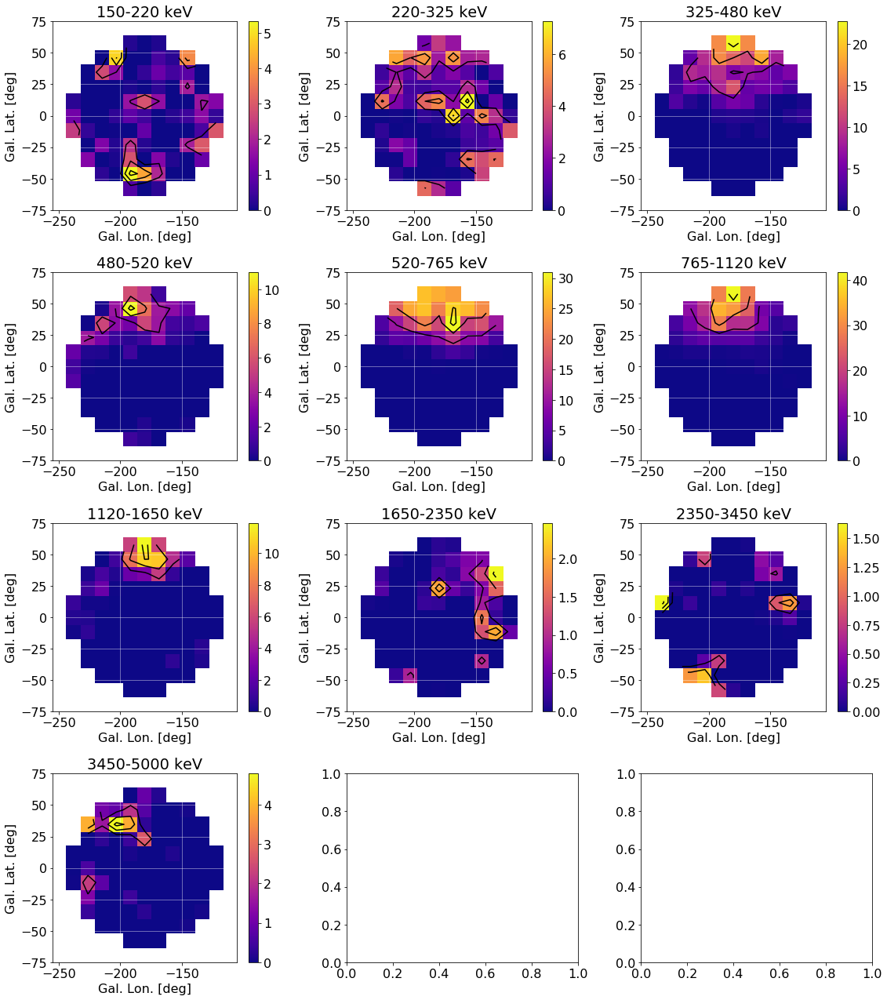

In [90]:
pc = result4.plot_TS_map_results()

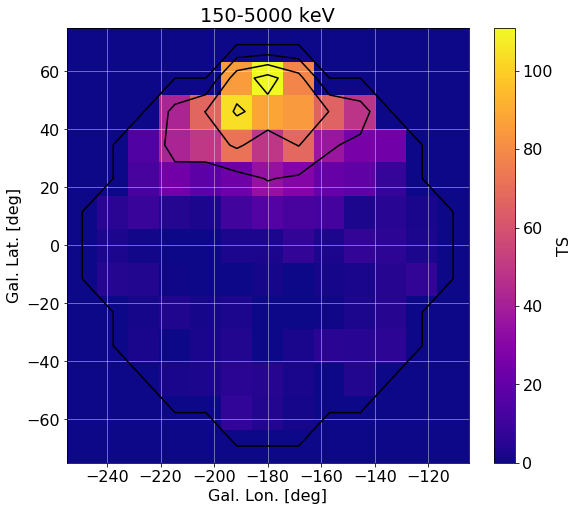

In [91]:
result4.plot_TS_map_results(mode='sum')

In [127]:
sdfsd


NameError: name 'sdfsd' is not defined